# Assessment 2

## Author: Rochit Marcus (a1934854)

#### Description of the Data
The dataset is sourced from Kaggle. This dataset contains information on 21,613 properties in Seattle, making it a comprehensive resource for exploring real estate market trends and building predictive models for house prices. The data includes various features capturing property details, location, and market conditions, providing ample opportunities for data exploration, visualization, and machine learning applications.

Based on the dataset, price of the property is sought to be predicted. There are four models which are deployed and the model which provides the optimal output will used (save the model and use for prediction) for the prediction.

The four models are:
1. Linear Regression
2. Polynomial Regression
3. Support Vector Regression
4. Random Forest Regression

Following is the data dictionary of the dataset:
| Fields           | Description                                         |
|------------------|-----------------------------------------------------|
| id               | Unique identifier for each property.                |
| date             | Date of Sale.                                       |
| price            | Sales Price of the house.                           |
| bedrooms         | Number of bedrooms in the property.                 |
| bathrooms        | Number of bathrooms, including partials as fractions. |
| sqft_living      | Living space area in square feet.                   |
| sqft_lot         | Lot size in square feet.                            |
| floors           | Number of floors.                                   |
| waterfront       | Whether the property has a waterfront view.         |
| view             | Quality of the view rating.                         |
| condition        | Overall condition of the house.                     |
| grade            | Grade of construction and design (scale of 1-13).   |
| sqft_above       | Square footage of the property above ground.        |
| sqft_basement    | Basement area in square feet.                       |
| yr_built         | Year of the property built.                         |
| yr_renovated     | Year of last renovation.                            |
| zipcode          | ZIP code of the property.                           |
| lat              | Latitude of the property.                           |
| long             | Longitude of the property.                          |
| sqft_living15    | Average living space of 15 nearest properties.      |
| sqft_lot15       | Average lot size of 15 nearest properties.          |



### 1. Loading Dataset and Invoking libraries

In [2]:
# Invoking the required library
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns



house_price_dataset = pd.read_csv("B:/Master Studies/Course Works/7211OL - Foundations of Computer Sciences Python B/Assessments/Assessment 2/house_prices.csv")

print("\n Sample records from the House Price Dataset:")
print(house_price_dataset.head(5))

# Getting the number of records (rows) and fields (columns)
num_records, num_fields = house_price_dataset.shape
print(f"\nThe dataset has {num_records} records and {num_fields} fields.")

# Display information about the dataset
print("\nThe field has data types:")
print(house_price_dataset.info())


 Sample records from the House Price Dataset:
           id             date     price  bedrooms  bathrooms  sqft_living  \
0  7129300520  20141013T000000  221900.0         3       1.00       1180.0   
1  6414100192  20141209T000000  538000.0         3       2.25       2570.0   
2  5631500400  20150225T000000  180000.0         2       1.00        770.0   
3  2487200875  20141209T000000  604000.0         4       3.00       1960.0   
4  1954400510  20150218T000000  510000.0         3       2.00       1680.0   

   sqft_lot  floors waterfront  view  ... grade  sqft_above  sqft_basement  \
0    5650.0     1.0          N     0  ...     7        1180              0   
1    7242.0     2.0          N     0  ...     7        2170            400   
2   10000.0     1.0          N     0  ...     6         770              0   
3    5000.0     1.0          N     0  ...     7        1050            910   
4    8080.0     1.0          N     0  ...     8        1680              0   

   yr_built  yr

Exhibit 1 - Field Data Types and Shape of Dataset

### 2. Pre-processing the dataset

#### 2.1 Detecting and removing of missing values

In [3]:
# Detecting for missing values including NaN
missing_values = house_price_dataset.isnull().sum()
print(missing_values)


id               0
date             0
price            7
bedrooms         0
bathrooms        0
sqft_living      1
sqft_lot         3
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              1
long             1
sqft_living15    0
sqft_lot15       0
dtype: int64


Exhibit 2 - Missing Values

In [4]:
# Removing the records with missing values
house_price_dataset_cleaned = house_price_dataset.dropna()

# Getting the number of records (rows) and fields (columns)
num_records, num_fields = house_price_dataset_cleaned.shape
print(f"\nThe dataset has {num_records} records and {num_fields} fields.")

# Detecting for missing values [post removal]
missing_values = house_price_dataset_cleaned.isnull().sum()
print("\nFollowing numbers will confirm that there are no missing values now.")
print(missing_values)


The dataset has 21601 records and 21 fields.

Following numbers will confirm that there are no missing values now.
id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64


Exhibit 3 - Removal of missing records

#### 2.2 Feature Engineering
There is a date of sale and field which has latitude and longitude of the properties. Based on these, I am generating two new features or fields 'year_since_last_sale' and 'distance to Seattle downtown inKM' (I've Googled Seattle co-ordinates). 

These two new fields can enhance the quality of prediction which I am seeking with the models. The field 'year_since_last_sale' is derived from the field 'date' as current date minus 'date'. 

And, 'distance_to_Seattle_downtown_inKM' is calculated using geopy.distance function calculating distance between the property co-ordinates (latitude,longitude) and Seattle downtown co-ordinates (latitude, longitude).

In [5]:
# Calling functions from libraries
from datetime import datetime
from geopy.distance import great_circle


# Function to add Year Fraction Since Date of Sale
def calculate_year_fraction(date_of_sale):
    today_date = datetime.now()
    date_of_sale = pd.to_datetime(date_of_sale, format='%Y%m%dT%H%M%S')
    days_since_sale = (today_date - date_of_sale).days
    year_fraction = days_since_sale / 365.25
    return year_fraction

# Function to add Distance to Seattle
seattle_coords = (47.608013, -122.335167)  # Seattle downtown coordinates

def calculate_distance_to_seattle(lat, long):
    property_coords = (lat, long)
    distance = great_circle(property_coords, seattle_coords).kilometers
    return distance

# Make a copy of the dataset to avoid SettingWithCopyWarning
house_price_dataset_cleaned = house_price_dataset_cleaned.copy()

# Apply the feature engineering functions
house_price_dataset_cleaned.loc[:, 'Year_Since_Last_Sale'] = house_price_dataset_cleaned['date'].apply(calculate_year_fraction)
house_price_dataset_cleaned.loc[:, 'Distance_to_Seattle_Downtown_inKM'] = house_price_dataset_cleaned.apply(lambda row: calculate_distance_to_seattle(row['lat'], row['long']), axis=1)

print("\nSample records post Feature engineering:")
print(house_price_dataset_cleaned.head())

# Getting the number of records (rows) and fields (columns)
num_records_cleaned, num_fields_cleaned = house_price_dataset_cleaned.shape
print(f"\nThe dataset has {num_records_cleaned} records and {num_fields_cleaned} fields.")




Sample records post Feature engineering:
           id             date     price  bedrooms  bathrooms  sqft_living  \
0  7129300520  20141013T000000  221900.0         3       1.00       1180.0   
1  6414100192  20141209T000000  538000.0         3       2.25       2570.0   
2  5631500400  20150225T000000  180000.0         2       1.00        770.0   
3  2487200875  20141209T000000  604000.0         4       3.00       1960.0   
4  1954400510  20150218T000000  510000.0         3       2.00       1680.0   

   sqft_lot  floors waterfront  view  ... sqft_basement  yr_built  \
0    5650.0     1.0          N     0  ...             0      1955   
1    7242.0     2.0          N     0  ...           400      1951   
2   10000.0     1.0          N     0  ...             0      1933   
3    5000.0     1.0          N     0  ...           910      1965   
4    8080.0     1.0          N     0  ...             0      1987   

   yr_renovated  zipcode      lat     long  sqft_living15  sqft_lot15  \
0

Exhibit 4 - Feature Engineering

#### 2.3 Removal of Unwanted Fields

In the dataset, I intend to drop the following fields with the reasons provided:
1. ID of the property, which is the first column, since it is unique identifier doesn't have predictive power in the prediction of the price. 
2. 'date' since I have derived the 'Year_Since_Last_Sale' from 'date'.
3. 'lat' and 'long' since I have calculated the distance from the Seattle downtown. 


In [6]:
# Remove the first column 'id'
house_price_dataset_cleaned = house_price_dataset_cleaned.drop(columns=['id','date','lat','long'])

# Display the first few rows to check the dataset
print(house_price_dataset_cleaned.head())

# Getting the number of records (rows) and fields (columns)
num_records_removed, num_fields_removed = house_price_dataset_cleaned.shape
print(f"\nThe dataset has {num_records_removed} records and {num_fields_removed} fields.")


      price  bedrooms  bathrooms  sqft_living  sqft_lot  floors waterfront  \
0  221900.0         3       1.00       1180.0    5650.0     1.0          N   
1  538000.0         3       2.25       2570.0    7242.0     2.0          N   
2  180000.0         2       1.00        770.0   10000.0     1.0          N   
3  604000.0         4       3.00       1960.0    5000.0     1.0          N   
4  510000.0         3       2.00       1680.0    8080.0     1.0          N   

   view  condition  grade  sqft_above  sqft_basement  yr_built  yr_renovated  \
0     0    Average      7        1180              0      1955             0   
1     0    Average      7        2170            400      1951          1991   
2     0    Average      6         770              0      1933             0   
3     0  Very Good      7        1050            910      1965             0   
4     0    Average      8        1680              0      1987             0   

   zipcode  sqft_living15  sqft_lot15  Year_Since_

Exhibit 5 - Removal of the Fields

#### 2.4 Outlier Detection
Checking on the outliers, if there are any,in the price data. This will help in capturing the extreme case

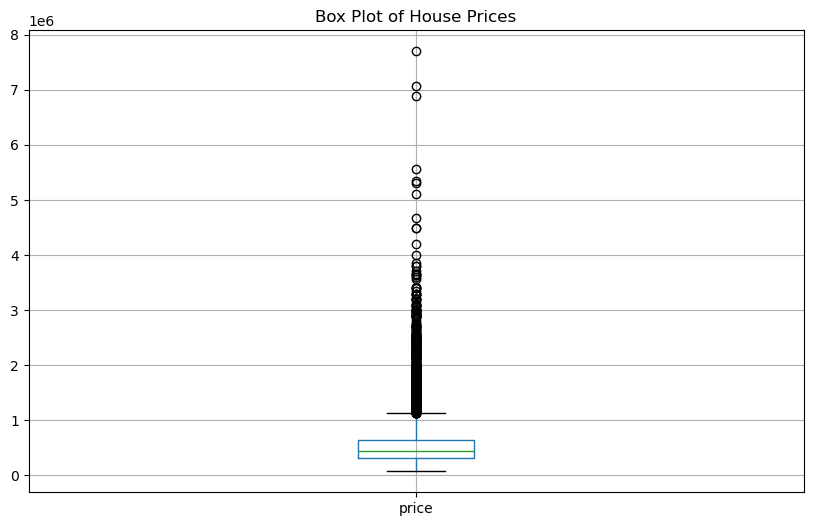

In [7]:
import matplotlib.pyplot as plt

# Create a box plot to visualize outliers
plt.figure(figsize=(10, 6))
house_price_dataset_cleaned.boxplot(column=['price'])
plt.title('Box Plot of House Prices')
plt.show()


Figure 1 - Box-plot of Price Data

From Figure 1, there are significant number of outliers present in the price data. It is interesting to see which feature is driving this exorbitant level prices in Seattle. In the following section, correlation is drawn with numbers (correlation matrix) and visually (pair-plot).

#### 2.5 Correlation among Features
Below are the two ways showing the same information which I mentioned above.

Before going ahead with the correlation computation, I would be doing one-hot encoding on the categorical variables, waterfront (it has values 'Y','N'), condition ('Average','Fair','Good','Very Good','Poor'), zipcode (there are a number of ZIP Codes).

##### 2.5.1 One-hot Encoding and Standardization

In [8]:
import pandas as pd
from sklearn.preprocessing import StandardScaler, OneHotEncoder

# Assuming 'house_price_dataset_cleaned' is your dataset with the new features
# Select numeric fields
numeric_columns = ['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors','view','grade', 
                   'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'sqft_living15', 'sqft_lot15', 'Year_Since_Last_Sale', 
                   'Distance_to_Seattle_Downtown_inKM']

# Scale numeric fields
scaler = StandardScaler()
house_price_dataset_cleaned[numeric_columns] = scaler.fit_transform(house_price_dataset_cleaned[numeric_columns])

# One-Hot Encode categorical fields
categorical_columns = ['waterfront', 'condition','zipcode']
encoder = OneHotEncoder(sparse_output=False, drop='first')  # drop='first' to avoid multicollinearity

# Apply one-hot encoding to categorical columns and convert to DataFrame
encoded_categorical = encoder.fit_transform(house_price_dataset_cleaned[categorical_columns])
encoded_categorical_df = pd.DataFrame(encoded_categorical, columns=encoder.get_feature_names_out(categorical_columns))

# Concatenate encoded categorical features with the original DataFrame (excluding original categorical columns)
house_price_dataset_encoded = pd.concat([house_price_dataset_cleaned.drop(columns=categorical_columns), encoded_categorical_df], axis=1)

# Display the first few rows to check the changes
print(house_price_dataset_encoded.head())


      price  bedrooms  bathrooms  sqft_living  sqft_lot    floors      view  \
0 -0.866577 -0.398647  -1.447445    -0.979751 -0.228237 -0.915555 -0.305601   
1 -0.005715 -0.398647   0.175444     0.533458 -0.189792  0.936561 -0.305601   
2 -0.980686 -1.473836  -1.447445    -1.426094 -0.123190 -0.915555 -0.305601   
3  0.174029  0.676541   1.149178    -0.130612 -0.243934 -0.915555 -0.305601   
4 -0.081970 -0.398647  -0.149134    -0.435431 -0.169556 -0.915555 -0.305601   

      grade  sqft_above  sqft_basement  ...  zipcode_98146  zipcode_98148  \
0 -0.558869   -0.734716      -0.658615  ...            0.0            0.0   
1 -0.558869    0.460666       0.245160  ...            0.0            0.0   
2 -1.409679   -1.229773      -0.658615  ...            0.0            0.0   
3 -0.558869   -0.891685       1.397474  ...            0.0            0.0   
4  0.291940   -0.130988      -0.658615  ...            0.0            0.0   

   zipcode_98155  zipcode_98166  zipcode_98168  zipcode_98177 

Exhibit 6 - One hot Encoding 

##### 2.5.2 Correlation Matrix

In [9]:
# Generate the correlation matrix
correlation_matrix = house_price_dataset_encoded.corr()

# Display the correlation matrix
print(correlation_matrix)


                  price  bedrooms  bathrooms  sqft_living  sqft_lot    floors  \
price          1.000000  0.308504   0.525142     0.702040  0.089577  0.256812   
bedrooms       0.308504  1.000000   0.516132     0.576821  0.031790  0.175751   
bathrooms      0.525142  0.516132   1.000000     0.754699  0.087630  0.500809   
sqft_living    0.702040  0.576821   0.754699     1.000000  0.172690  0.354076   
sqft_lot       0.089577  0.031790   0.087630     0.172690  1.000000 -0.005370   
...                 ...       ...        ...          ...       ...       ...   
zipcode_98177 -0.005423  0.002209  -0.009016    -0.006548 -0.003085 -0.009922   
zipcode_98178 -0.000561 -0.006451  -0.005676    -0.004520  0.004792 -0.005030   
zipcode_98188 -0.005624 -0.005945  -0.011300    -0.003325  0.002380 -0.016465   
zipcode_98198  0.004109  0.006223  -0.000745    -0.002043  0.004821 -0.003647   
zipcode_98199  0.003880 -0.004235  -0.008280    -0.006982 -0.006206 -0.007926   

                   view    

Exhibit 7 - Correlation Values

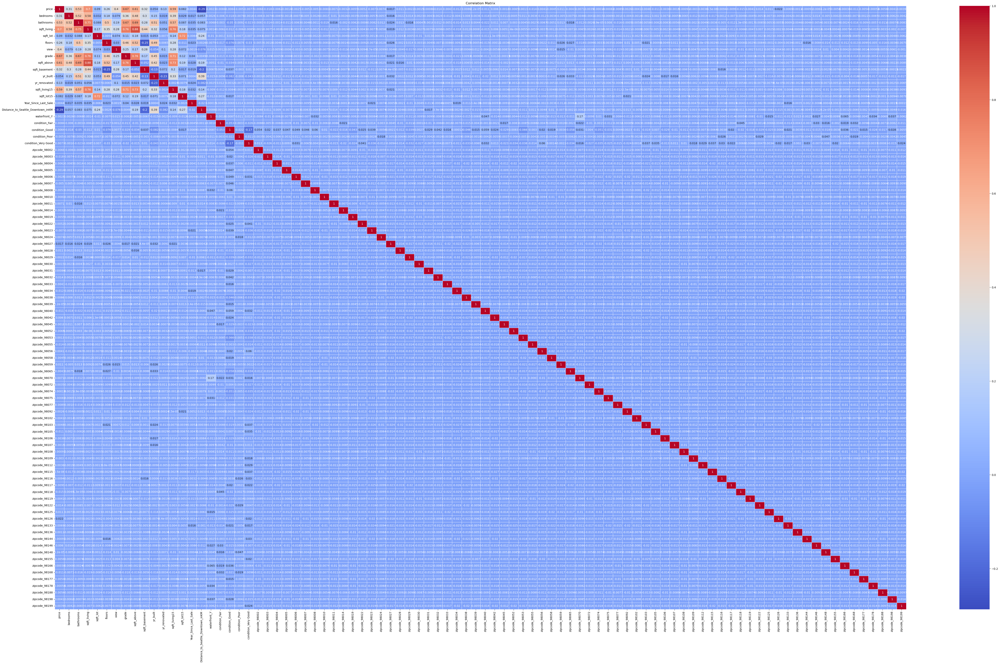

In [10]:
# Plot the correlation matrix
plt.figure(figsize=(70, 40))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

Figure 2 - Heat-map

Since there are a lot of features/fields which doesn't have significant correlations, this I am saying based on the colours. Since the numbers are not clearly visible. I am removing the columns which is 'zipcode'

In [11]:
# List of prefixes to exclude
exclude_prefixes = ['zipcode_']

# Filter columns to exclude based on prefixes
columns_to_exclude = [col for col in house_price_dataset_encoded.columns if any(col.startswith(prefix) for prefix in exclude_prefixes)]

# Keep only the columns that are not in the list of columns to exclude
filtered_dataset = house_price_dataset_encoded.drop(columns=columns_to_exclude)

# Display the columns of the filtered dataset
print(filtered_dataset.columns)


Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'view', 'grade', 'sqft_above', 'sqft_basement', 'yr_built',
       'yr_renovated', 'sqft_living15', 'sqft_lot15', 'Year_Since_Last_Sale',
       'Distance_to_Seattle_Downtown_inKM', 'waterfront_Y', 'condition_Fair',
       'condition_Good', 'condition_Poor', 'condition_Very Good'],
      dtype='object')


Exhibit 8 - List of Features after Removing the non-desired fields

In [12]:
# Generate the correlation matrix
correlation_matrix_new = filtered_dataset.corr()

# Display the correlation matrix
print(correlation_matrix_new)


                                      price  bedrooms  bathrooms  sqft_living  \
price                              1.000000  0.308504   0.525142     0.702040   
bedrooms                           0.308504  1.000000   0.516132     0.576821   
bathrooms                          0.525142  0.516132   1.000000     0.754699   
sqft_living                        0.702040  0.576821   0.754699     1.000000   
sqft_lot                           0.089577  0.031790   0.087630     0.172690   
floors                             0.256812  0.175751   0.500809     0.354076   
view                               0.397459  0.079491   0.187695     0.284547   
grade                              0.667498  0.357305   0.665009     0.762774   
sqft_above                         0.605588  0.477851   0.685351     0.876627   
sqft_basement                      0.323863  0.303000   0.283900     0.435091   
yr_built                           0.054008  0.154466   0.506175     0.318113   
yr_renovated                

Exhibit 9 - Correlation Matrix with reduced features

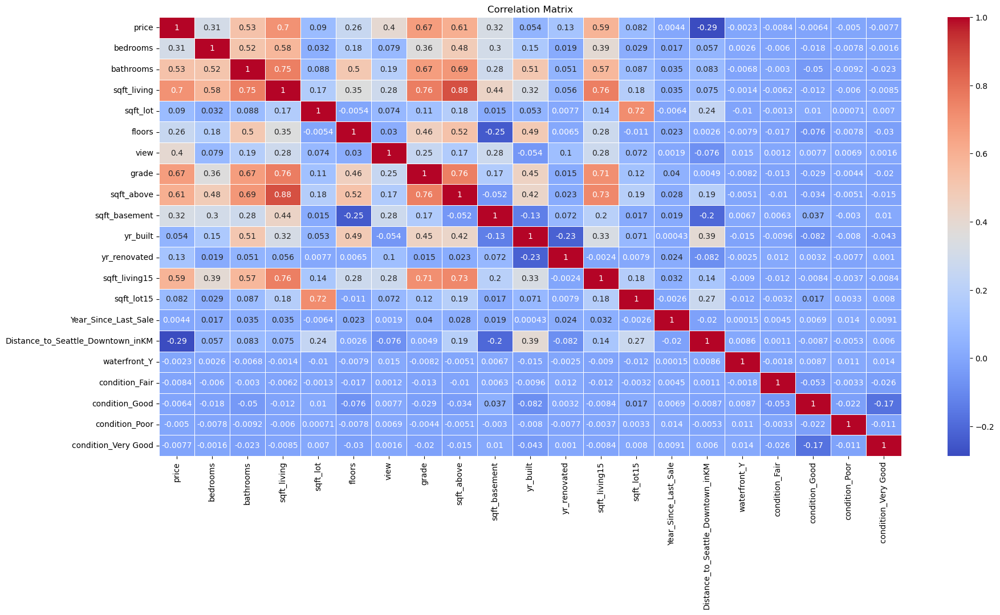

In [13]:

# Plot the correlation matrix
plt.figure(figsize=(21, 10))
sns.heatmap(correlation_matrix_new, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.show()

Figure 3 - Heatmap of Correlation Values with reduced features

##### 2.5.3 Visual Representation of Correlation Among Variables
Figure 2 represents the magnitude with below pairplot, the relationship can be visually expressed.

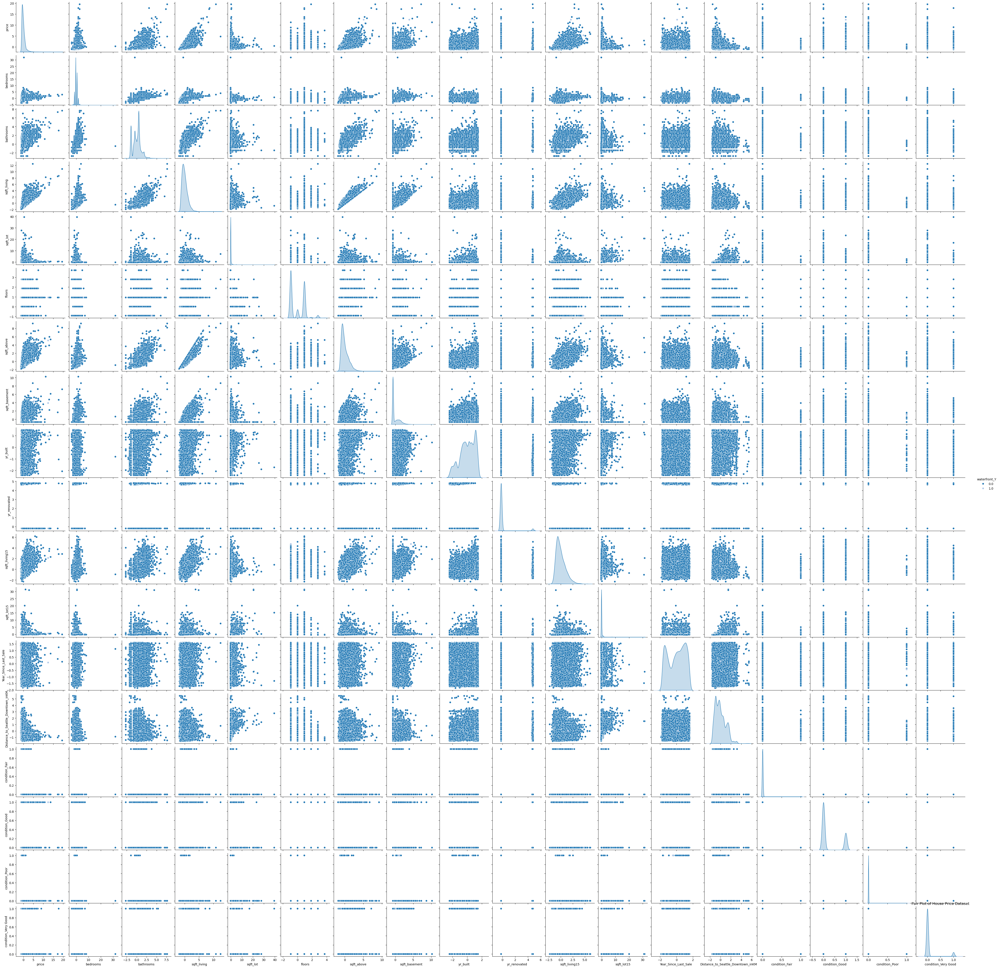

In [14]:
# Pair-plot
# Select features for the pair plot, including the new features and the target variable 'price'
features = ['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 
            'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated','sqft_living15', 'sqft_lot15', 'Year_Since_Last_Sale', 
            'Distance_to_Seattle_Downtown_inKM', 'waterfront_Y', 'condition_Fair','condition_Good','condition_Poor','condition_Very Good']

# Create pair plot with 'hue' variable
sns.pairplot(house_price_dataset_encoded[features], diag_kind='kde', markers='o', palette='tab20', hue='waterfront_Y')
plt.title('Pair Plot of House Price Dataset')
plt.show()

Figure 4 - Pairplot

#### 2.6 Feature Selection

From figures 3, The features those have significant effect on the price are in the order of the correlation values:

sqft_living: 0.7

grade: 0.67

sqft_above: 0.61

sqft_living15: 0.59

bathrooms: 0.53

view: 0.4

sqft_basement: 0.32

bedrooms: 0.31

Distance_to_Seattle_Downtown_inKM: -0.29, this implies the house price will be lower as we go far from the downtown and this makes in real world scenario.

From figure 4, it is visible the outliers are present along with bedrooms, bathrooms, sqft_living, sqft_above attributes. However, the correlation coefficient gives a quantitative measure in terms which measure is having correlated to the target variable 'price'.

### 3. Splitting of Dataset

The clean dataset is going to be splitted into training and testing dataset with the selected features mentioned in the section 2.6 with k-fold cross-validation method.

Before proceeding to the splitting into training and testing dataset. It is always safe to check whether there is any missing values crept due to one-hot encoding and the dropping of fields.

Step1. Check for missing values.

In [15]:
# Select features based on correlation values
selected_features = ['sqft_living', 'grade', 'sqft_above', 'sqft_living15', 'bathrooms', 
                     'view', 'sqft_basement', 'bedrooms', 'Distance_to_Seattle_Downtown_inKM']

house_price_dataset_encoded[selected_features]

# Detecting for missing values including NaN
missing_values = house_price_dataset_encoded[selected_features].isnull().sum()
print(missing_values)


sqft_living                          12
grade                                12
sqft_above                           12
sqft_living15                        12
bathrooms                            12
view                                 12
sqft_basement                        12
bedrooms                             12
Distance_to_Seattle_Downtown_inKM    12
dtype: int64


Exhibit 10 - Missing values

In [16]:
house_price_dataset_encoded

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,view,grade,sqft_above,sqft_basement,...,zipcode_98146,zipcode_98148,zipcode_98155,zipcode_98166,zipcode_98168,zipcode_98177,zipcode_98178,zipcode_98188,zipcode_98198,zipcode_98199
0,-0.866577,-0.398647,-1.447445,-0.979751,-0.228237,-0.915555,-0.305601,-0.558869,-0.734716,-0.658615,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,-0.005715,-0.398647,0.175444,0.533458,-0.189792,0.936561,-0.305601,-0.558869,0.460666,0.245160,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,-0.980686,-1.473836,-1.447445,-1.426094,-0.123190,-0.915555,-0.305601,-1.409679,-1.229773,-0.658615,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.174029,0.676541,1.149178,-0.130612,-0.243934,-0.915555,-0.305601,-0.558869,-0.891685,1.397474,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.081970,-0.398647,-0.149134,-0.435431,-0.169556,-0.915555,-0.305601,0.291940,-0.130988,-0.658615,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1637,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1702,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
5271,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Exhibit 11 - Showing the cause of missing values

Reason for the presence of missing value.

The blank values for the features are happening due to the one-hot encoding values were not having feature values and those fields/features (referring to zipcode features) are removed, therefore, the missing values left in the dateset. I will remove those missing values and proceed to modelling.

In [17]:
# To remove the missing values, I am coming up with another dataset including target field price
selected_fields = ['sqft_living', 'grade', 'sqft_above', 'sqft_living15', 'bathrooms', 
                     'view', 'sqft_basement', 'bedrooms', 'Distance_to_Seattle_Downtown_inKM','price']
house_price_new = house_price_dataset_encoded[selected_fields]
house_price_new


,sqft_living,grade,sqft_above,sqft_living15,bathrooms,view,sqft_basement,bedrooms,Distance_to_Seattle_Downtown_inKM,price
0,-0.979751,-0.558869,-0.734716,-0.943309,-1.447445,-0.305601,-0.658615,-0.398647,-0.587879,-0.866577
1,0.533458,-0.558869,0.460666,-0.432689,0.175444,-0.305601,0.245160,-0.398647,-0.554117,-0.005715
2,-1.426094,-1.409679,-1.229773,1.069992,-1.447445,-0.305601,-0.658615,-1.473836,-0.207463,-0.980686
3,-0.130612,-0.558869,-0.891685,-0.914131,1.149178,-0.305601,1.397474,0.676541,-0.740179,0.174029
4,-0.435431,0.291940,-0.130988,-0.272209,-0.149134,-0.305601,-0.658615,-0.398647,0.298268,-0.081970
...,...,...,...,...,...,...,...,...,...,...
1637,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1702,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5271,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Exhibit 12 - New dataset

Step 2. Remove the missing values and check again.

In [18]:
# Remove rows with any missing values
house_price_new = house_price_new.dropna()

#Checking after removing the missing values
missing_values = house_price_new.isnull().sum()

missing_values

sqft_living                          0
grade                                0
sqft_above                           0
sqft_living15                        0
bathrooms                            0
view                                 0
sqft_basement                        0
bedrooms                             0
Distance_to_Seattle_Downtown_inKM    0
price                                0
dtype: int64

Exhibit 13 - Missing values are removed and checked

After removing the missing values, performing the k-fold splitting of the dataset.

In [19]:
# Invoking function on splitting
from sklearn.model_selection import KFold

# Select features based on correlation values
selected_features = ['sqft_living', 'grade', 'sqft_above', 'sqft_living15', 'bathrooms', 
                     'view', 'sqft_basement', 'bedrooms', 'Distance_to_Seattle_Downtown_inKM']

# Extract the features and target variable
X = house_price_new[selected_features]
y = house_price_new['price']

# Set up k-fold cross-validation with k=10
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Store the k-fold split indices in a list
splits = []

# Perform k-fold cross-validation and store the split indices
for train_index, test_index in kf.split(X):
    splits.append((train_index, test_index))

print(f'Splits stored: {len(splits)}')


Splits stored: 10


Exhibit 14 - k=10 Splits are stored

### 4. Data Model

After performing the k-fold cross-validation splitting, following models will be applied, they are as follows:
1. Linear Regression
2. Polynomial Regression
3. Support Vector Machine for Regression
4. Random Forest Regression

#### 4.1 Linear Regression

##### 4.1.1 Model Execution without Hyper parameter tuning

In [20]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Remove records with missing values from the dataset
X_cleaned = X.dropna()
y_cleaned = y[X_cleaned.index]

# Instantiate the Linear Regression model
linear_regression = LinearRegression()

# Lists to store performance metrics for each fold
mse_scores_train = []
rmse_scores_train = []
r2_scores_train = []
mse_scores_test = []
rmse_scores_test = []
r2_scores_test = []

# Use the stored k-fold splits to run the model
for fold, (train_index, test_index) in enumerate(splits):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    # Train the model
    linear_regression.fit(X_train, y_train)
    
    # Predict on the training set
    y_pred_train = linear_regression.predict(X_train)
    
    # Predict on the test set
    y_pred_test = linear_regression.predict(X_test)
    
    # Evaluate performance on the training set
    mse_train = mean_squared_error(y_train, y_pred_train)
    rmse_train = np.sqrt(mse_train)
    r2_train = r2_score(y_train, y_pred_train)
    
    # Evaluate performance on the test set
    mse_test = mean_squared_error(y_test, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(y_test, y_pred_test)
    
    # Store the metrics for training set
    mse_scores_train.append(mse_train)
    rmse_scores_train.append(rmse_train)
    r2_scores_train.append(r2_train)
    
    # Store the metrics for test set
    mse_scores_test.append(mse_test)
    rmse_scores_test.append(rmse_test)
    r2_scores_test.append(r2_test)
    
    print(f'Fold {fold + 1} - Training')
    print(f'MSE: {mse_train}, RMSE: {rmse_train}, R²: {r2_train}')
    print(f'Fold {fold + 1} - Test')
    print(f'MSE: {mse_test}, RMSE: {rmse_test}, R²: {r2_test}')
    print('-' * 40)

# Calculate mean and standard deviation of the performance metrics for training set
mean_mse_train = np.mean(mse_scores_train)
std_mse_train = np.std(mse_scores_train)
mean_rmse_train = np.mean(rmse_scores_train)
std_rmse_train = np.std(rmse_scores_train)
mean_r2_train = np.mean(r2_scores_train)
std_r2_train = np.std(r2_scores_train)

# Calculate mean and standard deviation of the performance metrics for test set
mean_mse_test = np.mean(mse_scores_test)
std_mse_test = np.std(mse_scores_test)
mean_rmse_test = np.mean(rmse_scores_test)
std_rmse_test = np.std(rmse_scores_test)
mean_r2_test = np.mean(r2_scores_test)
std_r2_test = np.std(r2_scores_test)

print(f'Linear Regression - Training Set - Mean MSE: {mean_mse_train}, Std MSE: {std_mse_train}')
print(f'Linear Regression - Training Set - Mean RMSE: {mean_rmse_train}, Std RMSE: {std_rmse_train}')
print(f'Linear Regression - Training Set - Mean R²: {mean_r2_train}, Std R²: {std_r2_train}')

print(f'Linear Regression - Test Set - Mean MSE: {mean_mse_test}, Std MSE: {std_mse_test}')
print(f'Linear Regression - Test Set - Mean RMSE: {mean_rmse_test}, Std RMSE: {std_rmse_test}')
print(f'Linear Regression - Test Set - Mean R²: {mean_r2_test}, Std R²: {std_r2_test}')




Fold 1 - Training
MSE: 0.31242135104373403, RMSE: 0.5589466441832656, R²: 0.6790385792990568
Fold 1 - Test
MSE: 0.43011431818543233, RMSE: 0.6558310134367178, R²: 0.6526217787145264
----------------------------------------
Fold 2 - Training
MSE: 0.31762972164328346, RMSE: 0.5635864810685964, R²: 0.6778372534023127
Fold 2 - Test
MSE: 0.38265417115085465, RMSE: 0.6185904712738911, R²: 0.6603226634469734
----------------------------------------
Fold 3 - Training
MSE: 0.329222037701739, RMSE: 0.5737787358396432, R²: 0.6762467692904814
Fold 3 - Test
MSE: 0.27799927476447334, RMSE: 0.5272563653143254, R²: 0.6720546548586092
----------------------------------------
Fold 4 - Training
MSE: 0.31202336669857444, RMSE: 0.5585905179096531, R²: 0.6792285200506569
Fold 4 - Test
MSE: 0.4347476821111049, RMSE: 0.6593539884698544, R²: 0.650934365978761
----------------------------------------
Fold 5 - Training
MSE: 0.32867225058951655, RMSE: 0.5732994423418852, R²: 0.6755626950836507
Fold 5 - Test
MSE: 

Exhibit 15 - Linear Regression Output with Default parameters or without hyper parameter tuning

The above output is without performing the hyper parameter tuning. In the following section, I would be tuning.

##### 4.1.2 Hyper Parameter tuning in Linear Regression and Model Output
First step is grid search setup

In [21]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for alpha (regularization strength) for Ridge regression
param_grid = {
    'fit_intercept': [True, False],
    'copy_X': [True, False],
    'positive': [True, False]
}

# Set up GridSearchCV with cross-validation
grid_search = GridSearchCV(estimator=LinearRegression(), param_grid=param_grid, cv=10, scoring='r2', n_jobs=-1)

# Fit GridSearchCV to find the best parameters
grid_search.fit(X_cleaned, y_cleaned)

# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

print(f'Best Parameters: {best_params}')
print(f'Best R² Score: {best_score}')


Best Parameters: {'copy_X': True, 'fit_intercept': False, 'positive': False}
Best R² Score: 0.6743067635183768


Exhibit 16 - Model output with best parameter

Second step is evaluate the model with best parameters and training and testing datasets.

In [22]:
# Instantiate the Linear Regression model with the best parameters
best_linear_regression = LinearRegression(**best_params)

# Lists to store performance metrics for each fold
mse_scores_train = []
rmse_scores_train = []
r2_scores_train = []
mse_scores_test = []
rmse_scores_test = []
r2_scores_test = []

# Use the stored k-fold splits to run the model
for fold, (train_index, test_index) in enumerate(splits):
    X_train, X_test = X_cleaned.iloc[train_index], X_cleaned.iloc[test_index]
    y_train, y_test = y_cleaned.iloc[train_index], y_cleaned.iloc[test_index]
    
    # Train the model with the best parameters
    best_linear_regression.fit(X_train, y_train)
    
    # Predict on the training set
    y_pred_train = best_linear_regression.predict(X_train)
    
    # Predict on the test set
    y_pred_test = best_linear_regression.predict(X_test)
    
    # Evaluate performance on the training set
    mse_train = mean_squared_error(y_train, y_pred_train)
    rmse_train = np.sqrt(mse_train)
    r2_train = r2_score(y_train, y_pred_train)
    
    # Evaluate performance on the test set
    mse_test = mean_squared_error(y_test, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(y_test, y_pred_test)
    
    # Store the metrics for training set
    mse_scores_train.append(mse_train)
    rmse_scores_train.append(rmse_train)
    r2_scores_train.append(r2_train)
    
    # Store the metrics for test set
    mse_scores_test.append(mse_test)
    rmse_scores_test.append(rmse_test)
    r2_scores_test.append(r2_test)
    
    print(f'Fold {fold + 1} - Training')
    print(f'MSE: {mse_train}, RMSE: {rmse_train}, R²: {r2_train}')
    print(f'Fold {fold + 1} - Test')
    print(f'MSE: {mse_test}, RMSE: {rmse_test}, R²: {r2_test}')
    print('-' * 40)

# Calculate mean and standard deviation of the performance metrics for training set
mean_mse_train = np.mean(mse_scores_train)
std_mse_train = np.std(mse_scores_train)
mean_rmse_train = np.mean(rmse_scores_train)
std_rmse_train = np.std(rmse_scores_train)
mean_r2_train = np.mean(r2_scores_train)
std_r2_train = np.std(r2_scores_train)

# Calculate mean and standard deviation of the performance metrics for test set
mean_mse_test = np.mean(mse_scores_test)
std_mse_test = np.std(mse_scores_test)
mean_rmse_test = np.mean(rmse_scores_test)
std_rmse_test = np.std(rmse_scores_test)
mean_r2_test = np.mean(r2_scores_test)
std_r2_test = np.std(r2_scores_test)

print(f'Linear Regression with Best Parameters - Training Set - Mean MSE: {mean_mse_train}, Std MSE: {std_mse_train}')
print(f'Linear Regression with Best Parameters - Training Set - Mean RMSE: {mean_rmse_train}, Std RMSE: {std_rmse_train}')
print(f'Linear Regression with Best Parameters - Training Set - Mean R²: {mean_r2_train}, Std R²: {std_r2_train}')

print(f'Linear Regression with Best Parameters - Test Set - Mean MSE: {mean_mse_test}, Std MSE: {std_mse_test}')
print(f'Linear Regression with Best Parameters - Test Set - Mean RMSE: {mean_rmse_test}, Std RMSE: {std_rmse_test}')
print(f'Linear Regression with Best Parameters - Test Set - Mean R²: {mean_r2_test}, Std R²: {std_r2_test}')


Fold 1 - Training
MSE: 0.3124262664374667, RMSE: 0.5589510411811277, R²: 0.6790335295425325
Fold 1 - Test
MSE: 0.43002010904468824, RMSE: 0.65575918525377, R²: 0.6526978659368226
----------------------------------------
Fold 2 - Training
MSE: 0.3176299782385055, RMSE: 0.5635867087134911, R²: 0.6778369931451143
Fold 2 - Test
MSE: 0.38264950065216724, RMSE: 0.6185866961487025, R²: 0.6603268093904235
----------------------------------------
Fold 3 - Training
MSE: 0.32922203777980014, RMSE: 0.5737787359076669, R²: 0.676246769213717
Fold 3 - Test
MSE: 0.2779992757501398, RMSE: 0.527256366249038, R²: 0.6720546536958554
----------------------------------------
Fold 4 - Training
MSE: 0.3120233694856676, RMSE: 0.5585905204044083, R²: 0.6792285171854228
Fold 4 - Test
MSE: 0.4347476509796205, RMSE: 0.6593539648622889, R²: 0.6509343909747111
----------------------------------------
Fold 5 - Training
MSE: 0.32867226479217265, RMSE: 0.5732994547286546, R²: 0.6755626810639961
Fold 5 - Test
MSE: 0.283

Exhibit 17 - Model output on training and test dataset with tuned parameter

##### 4.1.3 Model Performance - Comparison with Baseline

In [23]:
# Lists to store baseline performance metrics for each fold
baseline_mse_scores = []
baseline_rmse_scores = []
baseline_r2_scores = []

# Use the stored k-fold splits to run the baseline evaluation
for fold, (train_index, test_index) in enumerate(splits):
    X_train, X_test = X_cleaned.iloc[train_index], X_cleaned.iloc[test_index]
    y_train, y_test = y_cleaned.iloc[train_index], y_cleaned.iloc[test_index]
    
    # Calculate the mean of the training target variable
    mean_train_target = y_train.mean()
    
    # Create baseline predictions for the test set using the mean value
    y_baseline_pred_test = np.repeat(mean_train_target, len(y_test))
    
    # Evaluate baseline performance on the test set
    baseline_mse = mean_squared_error(y_test, y_baseline_pred_test)
    baseline_rmse = np.sqrt(baseline_mse)
    baseline_r2 = r2_score(y_test, y_baseline_pred_test)
    
    # Store the baseline metrics for the test set
    baseline_mse_scores.append(baseline_mse)
    baseline_rmse_scores.append(baseline_rmse)
    baseline_r2_scores.append(baseline_r2)
    
    print(f'Fold {fold + 1} - Baseline')
    print(f'MSE: {baseline_mse}, RMSE: {baseline_rmse}, R²: {baseline_r2}')
    print('-' * 40)

# Calculate mean and standard deviation of the baseline performance metrics for the test set
mean_baseline_mse = np.mean(baseline_mse_scores)
std_baseline_mse = np.std(baseline_mse_scores)
mean_baseline_rmse = np.mean(baseline_rmse_scores)
std_baseline_rmse = np.std(baseline_rmse_scores)
mean_baseline_r2 = np.mean(baseline_r2_scores)
std_baseline_r2 = np.std(baseline_r2_scores)

print(f'Baseline - Mean MSE: {mean_baseline_mse}, Std MSE: {std_baseline_mse}')
print(f'Baseline - Mean RMSE: {mean_baseline_rmse}, Std RMSE: {std_baseline_rmse}')
print(f'Baseline - Mean R²: {mean_baseline_r2}, Std R²: {std_baseline_r2}')



Fold 1 - Baseline
MSE: 1.239491034586341, RMSE: 1.1133243168934832, R²: -0.0010645372383646379
----------------------------------------
Fold 2 - Baseline
MSE: 1.1266552351032124, RMSE: 1.0614401702890335, R²: -0.00011780434117025784
----------------------------------------
Fold 3 - Baseline
MSE: 0.8479945358820133, RMSE: 0.9208661878264471, R²: -0.00034743250121382907
----------------------------------------
Fold 4 - Baseline
MSE: 1.2454616117618107, RMSE: 1.1160025142273697, R²: -3.79640082259769e-07
----------------------------------------
Fold 5 - Baseline
MSE: 0.8825181185188758, RMSE: 0.9394243548678498, R²: -3.376461938109365e-05
----------------------------------------
Fold 6 - Baseline
MSE: 0.9228230926839506, RMSE: 0.9606368162234625, R²: -0.0005581221758890198
----------------------------------------
Fold 7 - Baseline
MSE: 0.920497375778932, RMSE: 0.9594255446770906, R²: -0.0003285194317126372
----------------------------------------
Fold 8 - Baseline
MSE: 0.9120071574960266,

Exhibit 18 - Baseline Metrics

From Exhibit 17 and 18, lets get the Linear Regression metric RMSE for test dataset and Baseline metric RMSE, respectively. The RMSE should be lower to consider the metric to be better, the baseline RMSE is nearly 0.9977 and Linear Regression RMSE with best parameter from Test is nearly 0.568. In this instance, the Linear Regression's performance is better than baseline. A point to be noted, the RMSE from the Linear regression model test data is the mean of each fold of test data samples.

##### 4.1.4 Plotting Predicted values versus Actual values

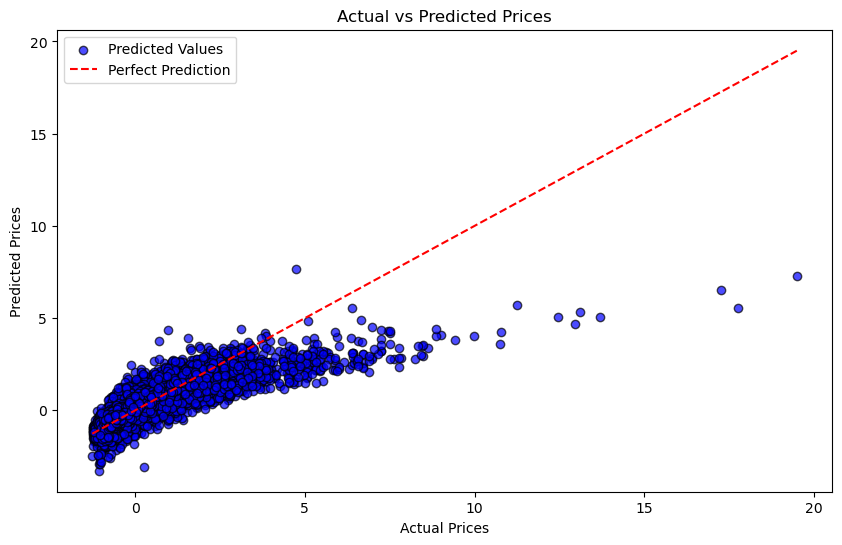

In [24]:
# Instantiate the Linear Regression model with the best parameters
best_linear_regression = LinearRegression(**best_params)

# Lists to store performance metrics for each fold
all_y_actual = []
all_y_pred = []

# Use the stored k-fold splits to run the model and collect predictions
for fold, (train_index, test_index) in enumerate(splits):
    X_train, X_test = X_cleaned.iloc[train_index], X_cleaned.iloc[test_index]
    y_train, y_test = y_cleaned.iloc[train_index], y_cleaned.iloc[test_index]
    
    # Train the model
    best_linear_regression.fit(X_train, y_train)
    
    # Predict on the test set
    y_pred_test = best_linear_regression.predict(X_test)
    
    # Collect actual and predicted values
    all_y_actual.extend(y_test)
    all_y_pred.extend(y_pred_test)

# Convert the lists to numpy arrays for plotting
all_y_actual = np.array(all_y_actual)
all_y_pred = np.array(all_y_pred)


# Plotting the actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(all_y_actual, all_y_pred, color='blue', edgecolors='k', alpha=0.7, label='Predicted Values')
plt.plot([min(all_y_actual), max(all_y_actual)], [min(all_y_actual), max(all_y_actual)], color='red', linestyle='--', label='Perfect Prediction')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual vs Predicted Prices')
plt.legend()
plt.show()


Figure 5 - Plotting Actual Price versus Predicted Price - Linear Regression

The blue balls in the plot corresponds to the pair of actual price and predicted price, and the red dotted line is when the model is perfectly predicting the actual prices which is an ideal case. 

The majority of the blue dots are clustered around the lower range of actual prices. This suggests that the model performs well for properties in the lower price range. There is a visible bias in the predicted value to stay below the perfect prediction red line. The predicted values are capped to nearly 700k. The model is not robust enough to take care of the edge cases or outliers.

#### 4.2 Polynomial Regression

##### 4.2.1 Model Execution without Hyper parameter tuning

In [25]:
# Invoking the required functions from the libraries
from sklearn.preprocessing import PolynomialFeatures

# Set the degree of the polynomial features
degree = 2

# Create Polynomial Features
poly_features = PolynomialFeatures(degree)

# Instantiate the Linear Regression model for fitting polynomial features
poly_regression_model = LinearRegression()

# Lists to store performance metrics for each fold
mse_scores_train = []
rmse_scores_train = []
r2_scores_train = []
mse_scores_test = []
rmse_scores_test = []
r2_scores_test = []

# Use the stored k-fold splits to run the model
for fold, (train_index, test_index) in enumerate(splits):
    X_train, X_test = X_cleaned.iloc[train_index], X_cleaned.iloc[test_index]
    y_train, y_test = y_cleaned.iloc[train_index], y_cleaned.iloc[test_index]
    
    # Transform the features
    X_train_poly = poly_features.fit_transform(X_train)
    X_test_poly = poly_features.transform(X_test)
    
    # Train the model
    poly_regression_model.fit(X_train_poly, y_train)
    
    # Predict on the training set
    y_pred_train = poly_regression_model.predict(X_train_poly)
    
    # Predict on the test set
    y_pred_test = poly_regression_model.predict(X_test_poly)
    
    # Evaluate performance on the training set
    mse_train = mean_squared_error(y_train, y_pred_train)
    rmse_train = np.sqrt(mse_train)
    r2_train = r2_score(y_train, y_pred_train)
    
    # Evaluate performance on the test set
    mse_test = mean_squared_error(y_test, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(y_test, y_pred_test)
    
    # Store the metrics for training set
    mse_scores_train.append(mse_train)
    rmse_scores_train.append(rmse_train)
    r2_scores_train.append(r2_train)
    
    # Store the metrics for test set
    mse_scores_test.append(mse_test)
    rmse_scores_test.append(rmse_test)
    r2_scores_test.append(r2_test)
    
    print(f'Fold {fold + 1} - Training')
    print(f'MSE: {mse_train}, RMSE: {rmse_train}, R²: {r2_train}')
    print(f'Fold {fold + 1} - Test')
    print(f'MSE: {mse_test}, RMSE: {rmse_test}, R²: {r2_test}')
    print('-' * 40)

# Calculate mean and standard deviation of the performance metrics for training set
mean_mse_train = np.mean(mse_scores_train)
std_mse_train = np.std(mse_scores_train)
mean_rmse_train = np.mean(rmse_scores_train)
std_rmse_train = np.std(rmse_scores_train)
mean_r2_train = np.mean(r2_scores_train)
std_r2_train = np.std(r2_scores_train)

# Calculate mean and standard deviation of the performance metrics for test set
mean_mse_test = np.mean(mse_scores_test)
std_mse_test = np.std(mse_scores_test)
mean_rmse_test = np.mean(rmse_scores_test)
std_rmse_test = np.std(rmse_scores_test)
mean_r2_test = np.mean(r2_scores_test)
std_r2_test = np.std(r2_scores_test)

print(f'Polynomial Regression - Training Set - Mean MSE: {mean_mse_train}, Std MSE: {std_mse_train}')
print(f'Polynomial Regression - Training Set - Mean RMSE: {mean_rmse_train}, Std RMSE: {std_rmse_train}')
print(f'Polynomial Regression - Training Set - Mean R²: {mean_r2_train}, Std R²: {std_r2_train}')

print(f'Polynomial Regression - Test Set - Mean MSE: {mean_mse_test}, Std MSE: {std_mse_test}')
print(f'Polynomial Regression - Test Set - Mean RMSE: {mean_rmse_test}, Std RMSE: {std_rmse_test}')
print(f'Polynomial Regression - Test Set - Mean R²: {mean_r2_test}, Std R²: {std_r2_test}')


Fold 1 - Training
MSE: 0.2023835347013956, RMSE: 0.4498705755007718, R²: 0.7920842906311304
Fold 1 - Test
MSE: 0.29381881083366446, RMSE: 0.5420505611413611, R²: 0.7626997019810714
----------------------------------------
Fold 2 - Training
MSE: 0.2047711716397261, RMSE: 0.452516487699317, R²: 0.7923064543891508
Fold 2 - Test
MSE: 0.22830870311821702, RMSE: 0.4778165998772092, R²: 0.7973332109412747
----------------------------------------
Fold 3 - Training
MSE: 0.2091445938037612, RMSE: 0.45732329243518877, R²: 0.7943295703954633
Fold 3 - Test
MSE: 0.18800381642009667, RMSE: 0.43359406870954387, R²: 0.7782189305492878
----------------------------------------
Fold 4 - Training
MSE: 0.20093576782290562, RMSE: 0.4482585948120857, R²: 0.7934306513602352
Fold 4 - Test
MSE: 0.2787146048164461, RMSE: 0.5279342807740809, R²: 0.7762157355990956
----------------------------------------
Fold 5 - Training
MSE: 0.20727265354258692, RMSE: 0.45527206540988974, R²: 0.7953980569470016
Fold 5 - Test
MSE

Exhibit 19 - Polynomial Regression Model Output with Default parameters or without hyper parameter tuning

##### 4.2.2 Hyper Parameter tuning in Polynomial Regression and Model Output
First step is grid search setup

In [26]:
# Import the required function from the library
from sklearn.model_selection import cross_val_score

# Define the parameter grid for Polynomial Regression
param_grid = {
    'degree': [2, 3, 4],
    'fit_intercept': [True, False]
}

# Set up lists to store best parameters and scores for each parameter combination
best_params_poly = None
best_score_poly = -np.inf

# Perform Grid Search
for degree in param_grid['degree']:
    for fit_intercept in param_grid['fit_intercept']:
        # Create Polynomial Features
        poly_features = PolynomialFeatures(degree)
        
        # Transform features
        X_poly = poly_features.fit_transform(X_cleaned)
        
        # Instantiate the Linear Regression model with current parameters
        poly_regression_model = LinearRegression(fit_intercept=fit_intercept)
        
        # Perform k-fold cross-validation
        scores = cross_val_score(poly_regression_model, X_poly, y_cleaned, cv=10, scoring='r2')
        
        # Get the mean R² score
        mean_score = np.mean(scores)
        
        # Update best parameters and score if current mean score is better
        if mean_score > best_score_poly:
            best_score_poly = mean_score
            best_params_poly = {'degree': degree, 'fit_intercept': fit_intercept}

print(f'Best Parameters (Polynomial Regression): {best_params_poly}')
print(f'Best R² Score (Polynomial Regression): {best_score_poly}')


Best Parameters (Polynomial Regression): {'degree': 2, 'fit_intercept': False}
Best R² Score (Polynomial Regression): 0.7758262418502648


Exhibit 20 - Model output with best parameter

Second step is evaluate the model with best parameters and training and testing datasets.

In [27]:
# Instantiate the Polynomial Regression model with the best parameters
poly_features = PolynomialFeatures(degree=best_params_poly['degree'])
best_poly_regression_model = LinearRegression(fit_intercept=best_params_poly['fit_intercept'])

# Lists to store performance metrics for each fold
mse_scores_train = []
rmse_scores_train = []
r2_scores_train = []
mse_scores_test = []
rmse_scores_test = []
r2_scores_test = []

# Use the stored k-fold splits to run the model
for fold, (train_index, test_index) in enumerate(splits):
    X_train, X_test = X_cleaned.iloc[train_index], X_cleaned.iloc[test_index]
    y_train, y_test = y_cleaned.iloc[train_index], y_cleaned.iloc[test_index]
    
    # Transform the features with the best degree
    X_train_poly = poly_features.fit_transform(X_train)
    X_test_poly = poly_features.transform(X_test)
    
    # Train the model
    best_poly_regression_model.fit(X_train_poly, y_train)
    
    # Predict on the training set
    y_pred_train = best_poly_regression_model.predict(X_train_poly)
    
    # Predict on the test set
    y_pred_test = best_poly_regression_model.predict(X_test_poly)
    
    # Evaluate performance on the training set
    mse_train = mean_squared_error(y_train, y_pred_train)
    rmse_train = np.sqrt(mse_train)
    r2_train = r2_score(y_train, y_pred_train)
    
    # Evaluate performance on the test set
    mse_test = mean_squared_error(y_test, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(y_test, y_pred_test)
    
    # Store the metrics for training set
    mse_scores_train.append(mse_train)
    rmse_scores_train.append(rmse_train)
    r2_scores_train.append(r2_train)
    
    # Store the metrics for test set
    mse_scores_test.append(mse_test)
    rmse_scores_test.append(rmse_test)
    r2_scores_test.append(r2_test)
    
    print(f'Fold {fold + 1} - Training')
    print(f'MSE: {mse_train}, RMSE: {rmse_train}, R²: {r2_train}')
    print(f'Fold {fold + 1} - Test')
    print(f'MSE: {mse_test}, RMSE: {rmse_test}, R²: {r2_test}')
    print('-' * 40)

# Calculate mean and standard deviation of the performance metrics for training set
mean_mse_train = np.mean(mse_scores_train)
std_mse_train = np.std(mse_scores_train)
mean_rmse_train = np.mean(rmse_scores_train)
std_rmse_train = np.std(rmse_scores_train)
mean_r2_train = np.mean(r2_scores_train)
std_r2_train = np.std(r2_scores_train)

# Calculate mean and standard deviation of the performance metrics for test set
mean_mse_test = np.mean(mse_scores_test)
std_mse_test = np.std(mse_scores_test)
mean_rmse_test = np.mean(rmse_scores_test)
std_rmse_test = np.std(rmse_scores_test)
mean_r2_test = np.mean(r2_scores_test)
std_r2_test = np.std(r2_scores_test)

print(f'Polynomial Regression with Best Parameters - Training Set - Mean MSE: {mean_mse_train}, Std MSE: {std_mse_train}')
print(f'Polynomial Regression with Best Parameters - Training Set - Mean RMSE: {mean_rmse_train}, Std RMSE: {std_rmse_train}')
print(f'Polynomial Regression with Best Parameters - Training Set - Mean R²: {mean_r2_train}, Std R²: {std_r2_train}')

print(f'Polynomial Regression with Best Parameters - Test Set - Mean MSE: {mean_mse_test}, Std MSE: {std_mse_test}')
print(f'Polynomial Regression with Best Parameters - Test Set - Mean RMSE: {mean_rmse_test}, Std RMSE: {std_rmse_test}')
print(f'Polynomial Regression with Best Parameters - Test Set - Mean R²: {mean_r2_test}, Std R²: {std_r2_test}')

Fold 1 - Training
MSE: 0.2023891185632207, RMSE: 0.44987678153381144, R²: 0.79207855413387
Fold 1 - Test
MSE: 0.29406071248177107, RMSE: 0.5422736509196912, R²: 0.762504332144048
----------------------------------------
Fold 2 - Training
MSE: 0.204770525040754, RMSE: 0.4525157732507829, R²: 0.792307110216004
Fold 2 - Test
MSE: 0.2282655483143661, RMSE: 0.4777714394083913, R²: 0.7973715189225714
----------------------------------------
Fold 3 - Training
MSE: 0.20914314375842472, RMSE: 0.4573217070710997, R²: 0.7943309963536574
Fold 3 - Test
MSE: 0.18801833332291182, RMSE: 0.4336108085863541, R²: 0.77820180550208
----------------------------------------
Fold 4 - Training
MSE: 0.2009356288920436, RMSE: 0.4482584398447436, R²: 0.7934307941862635
Fold 4 - Test
MSE: 0.27872256129290773, RMSE: 0.5279418162003344, R²: 0.7762093472211584
----------------------------------------
Fold 5 - Training
MSE: 0.20727193678898462, RMSE: 0.4552712782385735, R²: 0.7953987644652256
Fold 5 - Test
MSE: 0.2050

Exhibit 21 - Model output on training and test dataset with tuned parameter

##### 4.2.3 Model Performance - Comparison with Baseline

In [28]:
# Lists to store baseline performance metrics for each fold
baseline_mse_scores = []
baseline_rmse_scores = []
baseline_r2_scores = []

# Use the stored k-fold splits to run the baseline evaluation
for fold, (train_index, test_index) in enumerate(splits):
    X_train, X_test = X_cleaned.iloc[train_index], X_cleaned.iloc[test_index]
    y_train, y_test = y_cleaned.iloc[train_index], y_cleaned.iloc[test_index]
    
    # Calculate the mean of the training target variable
    mean_train_target = y_train.mean()
    
    # Create baseline predictions for the test set using the mean value
    y_baseline_pred_test = np.repeat(mean_train_target, len(y_test))
    
    # Evaluate baseline performance on the test set
    baseline_mse = mean_squared_error(y_test, y_baseline_pred_test)
    baseline_rmse = np.sqrt(baseline_mse)
    baseline_r2 = r2_score(y_test, y_baseline_pred_test)
    
    # Store the baseline metrics for the test set
    baseline_mse_scores.append(baseline_mse)
    baseline_rmse_scores.append(baseline_rmse)
    baseline_r2_scores.append(baseline_r2)
    
    print(f'Fold {fold + 1} - Baseline')
    print(f'MSE: {baseline_mse}, RMSE: {baseline_rmse}, R²: {baseline_r2}')
    print('-' * 40)

# Calculate mean and standard deviation of the baseline performance metrics for the test set
mean_baseline_mse = np.mean(baseline_mse_scores)
std_baseline_mse = np.std(baseline_mse_scores)
mean_baseline_rmse = np.mean(baseline_rmse_scores)
std_baseline_rmse = np.std(baseline_rmse_scores)
mean_baseline_r2 = np.mean(baseline_r2_scores)
std_baseline_r2 = np.std(baseline_r2_scores)

print(f'Baseline - Mean MSE: {mean_baseline_mse}, Std MSE: {std_baseline_mse}')
print(f'Baseline - Mean RMSE: {mean_baseline_rmse}, Std RMSE: {std_baseline_rmse}')
print(f'Baseline - Mean R²: {mean_baseline_r2}, Std R²: {std_baseline_r2}')


Fold 1 - Baseline
MSE: 1.239491034586341, RMSE: 1.1133243168934832, R²: -0.0010645372383646379
----------------------------------------
Fold 2 - Baseline
MSE: 1.1266552351032124, RMSE: 1.0614401702890335, R²: -0.00011780434117025784
----------------------------------------
Fold 3 - Baseline
MSE: 0.8479945358820133, RMSE: 0.9208661878264471, R²: -0.00034743250121382907
----------------------------------------
Fold 4 - Baseline
MSE: 1.2454616117618107, RMSE: 1.1160025142273697, R²: -3.79640082259769e-07
----------------------------------------
Fold 5 - Baseline
MSE: 0.8825181185188758, RMSE: 0.9394243548678498, R²: -3.376461938109365e-05
----------------------------------------
Fold 6 - Baseline
MSE: 0.9228230926839506, RMSE: 0.9606368162234625, R²: -0.0005581221758890198
----------------------------------------
Fold 7 - Baseline
MSE: 0.920497375778932, RMSE: 0.9594255446770906, R²: -0.0003285194317126372
----------------------------------------
Fold 8 - Baseline
MSE: 0.9120071574960266,

Exhibit 22 - Baseline Metrics

From Exhibit 21 and 22, lets get the Polynomial Regression metric RMSE for test dataset and Baseline metric RMSE, respectively. As mentioned previously, RMSE should be lower to consider the metric to be better, the baseline RMSE is nearly 0.9977 and Polynomial Regression RMSE with best parameter from Test is nearly 0.4688. In this instance, the Polynomial Regression's performance is better than baseline. Again, as mentioned, the RMSE from the Polynomial regression model test data is the average of each fold of test data samples.

##### 4.2.4 Plotting Predicted values versus Actual values

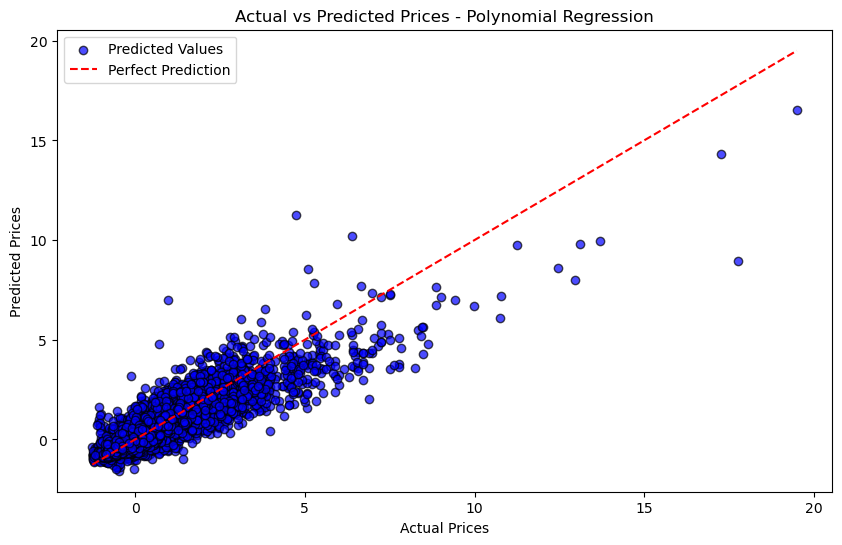

In [29]:
# Assuming the best parameters are obtained from GridSearchCV
best_degree = best_params_poly['degree']
best_fit_intercept = best_params_poly['fit_intercept']

# Create Polynomial Features with the best degree
poly_features = PolynomialFeatures(degree=best_degree)

# Transform the features
X_poly = poly_features.fit_transform(X_cleaned)

# Instantiate and fit the Polynomial Regression model with the best parameters
best_polynomial_regression_model = LinearRegression(fit_intercept=best_fit_intercept)
best_polynomial_regression_model.fit(X_poly, y_cleaned)

# Make predictions on the cleaned dataset
y_poly_pred = best_polynomial_regression_model.predict(X_poly)

# Plotting the actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_cleaned, y_poly_pred, color='blue', edgecolors='k', alpha=0.7, label='Predicted Values')
plt.plot([min(y_cleaned), max(y_cleaned)], [min(y_cleaned), max(y_cleaned)], color='red', linestyle='--', label='Perfect Prediction')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual vs Predicted Prices - Polynomial Regression')
plt.legend()
plt.show()


Figure 6 - Plotting Actual Price versus Predicted Price - Polynomial Regression

The scatter plot corresponding to Polynomial plot shows a good alignment of predicted values with actual prices for most data points along the line when comparing with the Linear Regression model, this indicate that the Polynomial Regression model's reliability is better than the Linear so far. Even the predicted price are not capped and going to the outlier range values aligning with the actual prices.

#### 4.3 Support Vector Regression
##### 4.3.1 Model Execution without Hyper parameter tuning

In [30]:
# Invoking the required function from the libraries
from sklearn.svm import SVR

# Instantiate the Support Vector Regression model
svr_model = SVR()

# Lists to store performance metrics for each fold
mse_scores_train = []
rmse_scores_train = []
r2_scores_train = []
mse_scores_test = []
rmse_scores_test = []
r2_scores_test = []

# Use the stored k-fold splits to run the model
for fold, (train_index, test_index) in enumerate(splits):
    X_train, X_test = X_cleaned.iloc[train_index], X_cleaned.iloc[test_index]
    y_train, y_test = y_cleaned.iloc[train_index], y_cleaned.iloc[test_index]
    
    # Train the model
    svr_model.fit(X_train, y_train)
    
    # Predict on the training set
    y_pred_train = svr_model.predict(X_train)
    
    # Predict on the test set
    y_pred_test = svr_model.predict(X_test)
    
    # Evaluate performance on the training set
    mse_train = mean_squared_error(y_train, y_pred_train)
    rmse_train = np.sqrt(mse_train)
    r2_train = r2_score(y_train, y_pred_train)
    
    # Evaluate performance on the test set
    mse_test = mean_squared_error(y_test, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(y_test, y_pred_test)
    
    # Store the metrics for training set
    mse_scores_train.append(mse_train)
    rmse_scores_train.append(rmse_train)
    r2_scores_train.append(r2_train)
    
    # Store the metrics for test set
    mse_scores_test.append(mse_test)
    rmse_scores_test.append(rmse_test)
    r2_scores_test.append(r2_test)
    
    print(f'Fold {fold + 1} - Training')
    print(f'MSE: {mse_train}, RMSE: {rmse_train}, R²: {r2_train}')
    print(f'Fold {fold + 1} - Test')
    print(f'MSE: {mse_test}, RMSE: {rmse_test}, R²: {r2_test}')
    print('-' * 40)

# Calculate mean and standard deviation of the performance metrics for training set
mean_mse_train = np.mean(mse_scores_train)
std_mse_train = np.std(mse_scores_train)
mean_rmse_train = np.mean(rmse_scores_train)
std_rmse_train = np.std(rmse_scores_train)
mean_r2_train = np.mean(r2_scores_train)
std_r2_train = np.std(r2_scores_train)

# Calculate mean and standard deviation of the performance metrics for test set
mean_mse_test = np.mean(mse_scores_test)
std_mse_test = np.std(mse_scores_test)
mean_rmse_test = np.mean(rmse_scores_test)
std_rmse_test = np.std(rmse_scores_test)
mean_r2_test = np.mean(r2_scores_test)
std_r2_test = np.std(r2_scores_test)

print(f'Support Vector Regression - Training Set - Mean MSE: {mean_mse_train}, Std MSE: {std_mse_train}')
print(f'Support Vector Regression - Training Set - Mean RMSE: {mean_rmse_train}, Std RMSE: {std_rmse_train}')
print(f'Support Vector Regression - Training Set - Mean R²: {mean_r2_train}, Std R²: {std_r2_train}')

print(f'Support Vector Regression - Test Set - Mean MSE: {mean_mse_test}, Std MSE: {std_mse_test}')
print(f'Support Vector Regression - Test Set - Mean RMSE: {mean_rmse_test}, Std RMSE: {std_rmse_test}')
print(f'Support Vector Regression - Test Set - Mean R²: {mean_r2_test}, Std R²: {std_r2_test}')


Fold 1 - Training
MSE: 0.2109736825518423, RMSE: 0.45931871565596183, R²: 0.7832593302086126
Fold 1 - Test
MSE: 0.3814263572357348, RMSE: 0.6175972451652734, R²: 0.6919442019811495
----------------------------------------
Fold 2 - Training
MSE: 0.22003241859139738, RMSE: 0.4690761330438774, R²: 0.7768274078785802
Fold 2 - Test
MSE: 0.319556453942033, RMSE: 0.5652932459724183, R²: 0.7163337202704442
----------------------------------------
Fold 3 - Training
MSE: 0.22810186731762053, RMSE: 0.47760011235092953, R²: 0.7756872018942507
Fold 3 - Test
MSE: 0.17822795290318022, RMSE: 0.4221705258579526, R²: 0.7897511510481594
----------------------------------------
Fold 4 - Training
MSE: 0.20121229688574077, RMSE: 0.4485669369065678, R²: 0.7931463693281772
Fold 4 - Test
MSE: 0.4582294206190394, RMSE: 0.6769264514103724, R²: 0.6320805151649036
----------------------------------------
Fold 5 - Training
MSE: 0.22767475866599624, RMSE: 0.47715276240004756, R²: 0.7752588331792921
Fold 5 - Test
MSE

Exhibit 23 - Support Vector Regression Model Output with Default parameters or without hyper parameter tuning

##### 4.3.2 Hyper Parameter tuning in Support Vector Regression and Model Output

First step is search setup, in this instance, instead of GridSearch I have used RandomizedSearch due to significant execution time of the model.

In [31]:
#Invoking Randomized Search as Gridsearch was taking more than 15 minutes and was still running
from sklearn.model_selection import RandomizedSearchCV

# Define a further reduced parameter grid for SVR
param_grid = {
    'C': [0.1, 1, 10,100],
    'epsilon': [0.01, 0.1, 1],
    'kernel': ['linear','poly', 'rbf']  
}

# Instantiate the SVR model
svr_model = SVR()

# Set up RandomizedSearchCV with fewer iterations
random_search_svr = RandomizedSearchCV(estimator=svr_model, param_distributions=param_grid, n_iter=5, cv=5, scoring='r2', n_jobs=-1, random_state=42)

# Fit RandomizedSearchCV to find the best parameters
random_search_svr.fit(X_cleaned.sample(frac=0.1, random_state=42), y_cleaned.sample(frac=0.1, random_state=42))  # Use 10% of the data for tuning to get the Best parameters

# Get the best parameters and best score
best_params_svr = random_search_svr.best_params_
best_score_svr = random_search_svr.best_score_

print(f'Best Parameters (SVR): {best_params_svr}')
print(f'Best R² Score (SVR): {best_score_svr}')




Best Parameters (SVR): {'kernel': 'linear', 'epsilon': 0.1, 'C': 100}
Best R² Score (SVR): 0.6170758401950839


Exhibit 24 - Model output with best parameter

Second step is evaluate the model with best parameters and training and testing datasets. 

Unfortunately due to machine getting crashed I had to cut down to k = 5 instead of 10. The model has taken 94 minutes even with k= 5.

In [32]:
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np

# Instantiate the SVR model with the best parameters
best_svr_model = SVR(C=best_params_svr['C'], epsilon=best_params_svr['epsilon'], kernel=best_params_svr['kernel'])

# Lists to store performance metrics for each fold
mse_scores_train = []
rmse_scores_train = []
r2_scores_train = []
mse_scores_test = []
rmse_scores_test = []
r2_scores_test = []

# Use 5-fold cross-validation splits to run the model
for fold, (train_index, test_index) in enumerate(splits):
    if fold >= 5:
        break
    X_train, X_test = X_cleaned.iloc[train_index], X_cleaned.iloc[test_index]
    y_train, y_test = y_cleaned.iloc[train_index], y_cleaned.iloc[test_index]
    
    # Train the model
    best_svr_model.fit(X_train, y_train)
    
    # Predict on the training set
    y_pred_train = best_svr_model.predict(X_train)
    
    # Predict on the test set
    y_pred_test = best_svr_model.predict(X_test)
    
    # Evaluate performance on the training set
    mse_train = mean_squared_error(y_train, y_pred_train)
    rmse_train = np.sqrt(mse_train)
    r2_train = r2_score(y_train, y_pred_train)
    
    # Evaluate performance on the test set
    mse_test = mean_squared_error(y_test, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(y_test, y_pred_test)
    
    # Store the metrics for the training set
    mse_scores_train.append(mse_train)
    rmse_scores_train.append(rmse_train)
    r2_scores_train.append(r2_train)
    
    # Store the metrics for the test set
    mse_scores_test.append(mse_test)
    rmse_scores_test.append(rmse_test)
    r2_scores_test.append(r2_test)
    
    print(f'Fold {fold + 1} - Training')
    print(f'MSE: {mse_train}, RMSE: {rmse_train}, R²: {r2_train}')
    print(f'Fold {fold + 1} - Test')
    print(f'MSE: {mse_test}, RMSE: {rmse_test}, R²: {r2_test}')
    print('-' * 40)

# Calculate mean and standard deviation of the performance metrics for the training set
mean_mse_train = np.mean(mse_scores_train)
std_mse_train = np.std(mse_scores_train)
mean_rmse_train = np.mean(rmse_scores_train)
std_rmse_train = np.std(rmse_scores_train)
mean_r2_train = np.mean(r2_scores_train)
std_r2_train = np.std(r2_scores_train)

# Calculate mean and standard deviation of the performance metrics for the test set
mean_mse_test = np.mean(mse_scores_test)
std_mse_test = np.std(mse_scores_test)
mean_rmse_test = np.mean(rmse_scores_test)
std_rmse_test = np.std(rmse_scores_test)
mean_r2_test = np.mean(r2_scores_test)
std_r2_test = np.std(r2_scores_test)

print(f'SVR with Best Parameters - Training Set - Mean MSE: {mean_mse_train}, Std MSE: {std_mse_train}')
print(f'SVR with Best Parameters - Training Set - Mean RMSE: {mean_rmse_train}, Std RMSE: {std_rmse_train}')
print(f'SVR with Best Parameters - Training Set - Mean R²: {mean_r2_train}, Std R²: {std_r2_train}')

print(f'SVR with Best Parameters - Test Set - Mean MSE: {mean_mse_test}, Std MSE: {std_mse_test}')
print(f'SVR with Best Parameters - Test Set - Mean RMSE: {mean_rmse_test}, Std RMSE: {std_rmse_test}')
print(f'SVR with Best Parameters - Test Set - Mean R²: {mean_r2_test}, Std R²: {std_r2_test}')


Fold 1 - Training
MSE: 0.34431161938403043, RMSE: 0.5867807251299504, R²: 0.646276587204595
Fold 1 - Test
MSE: 0.4882304076834724, RMSE: 0.6987348622213382, R²: 0.605684806508935
----------------------------------------
Fold 2 - Training
MSE: 0.35095136701288837, RMSE: 0.5924114845383134, R²: 0.6440400610681456
Fold 2 - Test
MSE: 0.43043238723177774, RMSE: 0.6560734617645937, R²: 0.6179105367613744
----------------------------------------
Fold 3 - Training
MSE: 0.36544124063855177, RMSE: 0.6045173617345921, R²: 0.6406292145047349
Fold 3 - Test
MSE: 0.2943396543272032, RMSE: 0.5425307865247863, R²: 0.6527785203435792
----------------------------------------
Fold 4 - Training
MSE: 0.343550570051797, RMSE: 0.5861318708719029, R²: 0.6468173971745723
Fold 4 - Test
MSE: 0.49249962761303234, RMSE: 0.7017831770661308, R²: 0.6045644362422791
----------------------------------------
Fold 5 - Training
MSE: 0.3649221367628519, RMSE: 0.60408785516914, R²: 0.6397798891044213
Fold 5 - Test
MSE: 0.303

Exhibit 25 - Model output on training and test dataset with tuned parameter

##### 4.3.3 Model Performance - Comparison with Baseline 
Since the baseline metric will remain the same, referring to the results given in section 4.2.3 Exhibit - 22 (or even section 4.1.3, I realised I don't have to re-write the code for this), the RMSE value for Baseline is nearly 0.9977. The RMSE value for SVR test data is nearly 0.6299. In this instance as well, the RMSE for SVR is better than Baseline with RMSE 0.9977.

##### 4.3.4 Plotting Predicted values versus Actual values

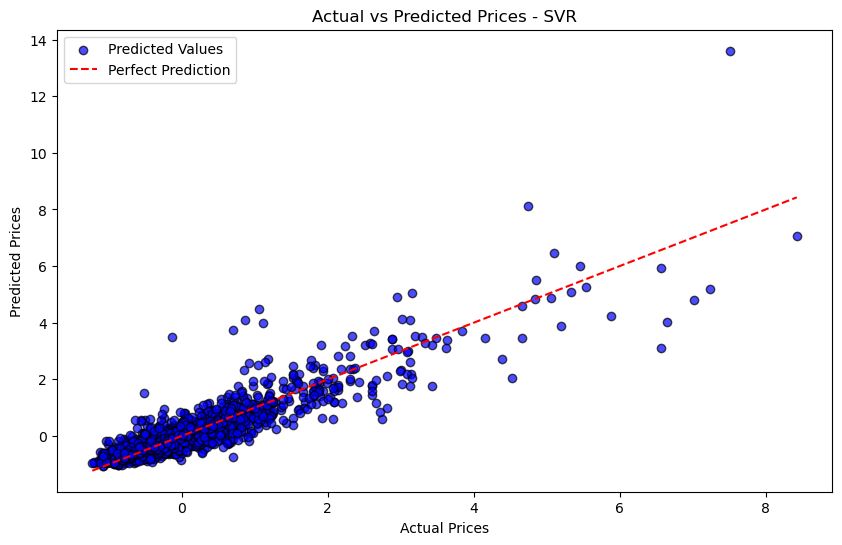

In [40]:
# Assuming the best parameters are obtained from GridSearchCV
best_C = best_params_svr['C']
best_epsilon = best_params_svr['epsilon']
best_kernel = best_params_svr['kernel']

# Instantiate and fit the SVR model with the best parameters
best_svr_model = SVR(C=best_C, epsilon=best_epsilon, kernel=best_kernel)
best_svr_model.fit(X_cleaned, y_cleaned)

# Make predictions on the cleaned dataset
y_svr_pred = best_svr_model.predict(X_cleaned)

# Plotting the actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_cleaned, y_svr_pred, color='blue', edgecolors='k', alpha=0.7, label='Predicted Values')
plt.plot([min(y_cleaned), max(y_cleaned)], [min(y_cleaned), max(y_cleaned)], color='red', linestyle='--', label='Perfect Prediction')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual vs Predicted Prices - SVR')
plt.legend()
plt.show()



Figure 7 - Plotting Actual Price versus Predicted Price - Support Vector Regression

The blue balls are uniformly lying on the either side of the Perfect prediction line, it implies there is no bias in the price range from 0 to 2. Similar to Polynomial regression, the predicted price is going to outlier range values aligning with the actual price, displaying a better model output in terms of reflecting the real current scenario.

#### 4.4 Random Forest Regression
##### 4.4.1 Model Execution without Hyper parameter tuning

In [36]:
# Invoking the required function from the library
from sklearn.ensemble import RandomForestRegressor

# Instantiate the Random Forest Regression model with default parameters
rf_model = RandomForestRegressor(random_state=42)

# Lists to store performance metrics for each fold
mse_scores_train = []
rmse_scores_train = []
r2_scores_train = []
mse_scores_test = []
rmse_scores_test = []
r2_scores_test = []

# Use the stored k-fold splits to run the model
for fold, (train_index, test_index) in enumerate(splits):
    X_train, X_test = X_cleaned.iloc[train_index], X_cleaned.iloc[test_index]
    y_train, y_test = y_cleaned.iloc[train_index], y_cleaned.iloc[test_index]
    
    # Train the model
    rf_model.fit(X_train, y_train)
    
    # Predict on the training set
    y_pred_train = rf_model.predict(X_train)
    
    # Predict on the test set
    y_pred_test = rf_model.predict(X_test)
    
    # Evaluate performance on the training set
    mse_train = mean_squared_error(y_train, y_pred_train)
    rmse_train = np.sqrt(mse_train)
    r2_train = r2_score(y_train, y_pred_train)
    
    # Evaluate performance on the test set
    mse_test = mean_squared_error(y_test, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(y_test, y_pred_test)
    
    # Store the metrics for the training set
    mse_scores_train.append(mse_train)
    rmse_scores_train.append(rmse_train)
    r2_scores_train.append(r2_train)
    
    # Store the metrics for the test set
    mse_scores_test.append(mse_test)
    rmse_scores_test.append(rmse_test)
    r2_scores_test.append(r2_test)
    
    print(f'Fold {fold + 1} - Training')
    print(f'MSE: {mse_train}, RMSE: {rmse_train}, R²: {r2_train}')
    print(f'Fold {fold + 1} - Test')
    print(f'MSE: {mse_test}, RMSE: {rmse_test}, R²: {r2_test}')
    print('-' * 40)

# Calculate mean and standard deviation of the performance metrics for the training set
mean_mse_train = np.mean(mse_scores_train)
std_mse_train = np.std(mse_scores_train)
mean_rmse_train = np.mean(rmse_scores_train)
std_rmse_train = np.std(rmse_scores_train)
mean_r2_train = np.mean(r2_scores_train)
std_r2_train = np.std(r2_scores_train)

# Calculate mean and standard deviation of the performance metrics for the test set
mean_mse_test = np.mean(mse_scores_test)
std_mse_test = np.std(mse_scores_test)
mean_rmse_test = np.mean(rmse_scores_test)
std_rmse_test = np.std(rmse_scores_test)
mean_r2_test = np.mean(r2_scores_test)
std_r2_test = np.std(r2_scores_test)

print(f'Random Forest Regression - Training Set - Mean MSE: {mean_mse_train}, Std MSE: {std_mse_train}')
print(f'Random Forest Regression - Training Set - Mean RMSE: {mean_rmse_train}, Std RMSE: {std_rmse_train}')
print(f'Random Forest Regression - Training Set - Mean R²: {mean_r2_train}, Std R²: {std_r2_train}')

print(f'Random Forest Regression - Test Set - Mean MSE: {mean_mse_test}, Std MSE: {std_mse_test}')
print(f'Random Forest Regression - Test Set - Mean RMSE: {mean_rmse_test}, Std RMSE: {std_rmse_test}')
print(f'Random Forest Regression - Test Set - Mean R²: {mean_r2_test}, Std R²: {std_r2_test}')


Fold 1 - Training
MSE: 0.02612235255426659, RMSE: 0.1616241088274475, R²: 0.9731635902608504
Fold 1 - Test
MSE: 0.20095675060711907, RMSE: 0.4482819989773391, R²: 0.837698965996492
----------------------------------------
Fold 2 - Training
MSE: 0.02575656797390194, RMSE: 0.16048852910380212, R²: 0.9738758494058022
Fold 2 - Test
MSE: 0.19001438964576134, RMSE: 0.4359064000972701, R²: 0.8313265955327166
----------------------------------------
Fold 3 - Training
MSE: 0.026175708191824493, RMSE: 0.16178908551513754, R²: 0.9742591044257788
Fold 3 - Test
MSE: 0.1624967777463716, RMSE: 0.40310889068137856, R²: 0.8083086299144264
----------------------------------------
Fold 4 - Training
MSE: 0.025413999326550533, RMSE: 0.15941768824867125, R²: 0.973873475369284
Fold 4 - Test
MSE: 0.19704825148783697, RMSE: 0.4439011731093273, R²: 0.8417869130333854
----------------------------------------
Fold 5 - Training
MSE: 0.025827325611395304, RMSE: 0.16070882244418103, R²: 0.9745054597717676
Fold 5 - T

Exhibit 26 - Random Forest Regression Output with Default parameters or without hyper parameter tuning

##### 4.4.2 Hyper Parameter tuning in Support Vector Regression and Model Output

First step is grid search setup.

In [37]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for Random Forest
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10]
}

# Instantiate the Random Forest model
rf_model = RandomForestRegressor(random_state=42)

# Set up GridSearchCV with cross-validation
grid_search_rf = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, scoring='r2', n_jobs=-1)

# Fit GridSearchCV to find the best parameters
grid_search_rf.fit(X_cleaned, y_cleaned)

# Get the best parameters and best score
best_params_rf = grid_search_rf.best_params_
best_score_rf = grid_search_rf.best_score_

print(f'Best Parameters (Random Forest): {best_params_rf}')
print(f'Best R² Score (Random Forest): {best_score_rf}')


Best Parameters (Random Forest): {'max_depth': 30, 'min_samples_split': 5, 'n_estimators': 200}
Best R² Score (Random Forest): 0.8178236256492861


Exhibit 27 - Model output with best parameter

Second step is evaluate the model with best parameters and training and testing datasets.

In [38]:
# Instantiate the Random Forest model with the best parameters
best_rf_model = RandomForestRegressor(
    n_estimators=best_params_rf['n_estimators'],
    max_depth=best_params_rf['max_depth'],
    min_samples_split=best_params_rf['min_samples_split'],
    random_state=42
)

# Lists to store performance metrics for each fold
mse_scores_train = []
rmse_scores_train = []
r2_scores_train = []
mse_scores_test = []
rmse_scores_test = []
r2_scores_test = []

# Use the stored k-fold splits to run the model
for fold, (train_index, test_index) in enumerate(splits):
    X_train, X_test = X_cleaned.iloc[train_index], X_cleaned.iloc[test_index]
    y_train, y_test = y_cleaned.iloc[train_index], y_cleaned.iloc[test_index]
    
    # Train the model
    best_rf_model.fit(X_train, y_train)
    
    # Predict on the training set
    y_pred_train = best_rf_model.predict(X_train)
    
    # Predict on the test set
    y_pred_test = best_rf_model.predict(X_test)
    
    # Evaluate performance on the training set
    mse_train = mean_squared_error(y_train, y_pred_train)
    rmse_train = np.sqrt(mse_train)
    r2_train = r2_score(y_train, y_pred_train)
    
    # Evaluate performance on the test set
    mse_test = mean_squared_error(y_test, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(y_test, y_pred_test)
    
    # Store the metrics for the training set
    mse_scores_train.append(mse_train)
    rmse_scores_train.append(rmse_train)
    r2_scores_train.append(r2_train)
    
    # Store the metrics for the test set
    mse_scores_test.append(mse_test)
    rmse_scores_test.append(rmse_test)
    r2_scores_test.append(r2_test)
    
    print(f'Fold {fold + 1} - Training')
    print(f'MSE: {mse_train}, RMSE: {rmse_train}, R²: {r2_train}')
    print(f'Fold {fold + 1} - Test')
    print(f'MSE: {mse_test}, RMSE: {rmse_test}, R²: {r2_test}')
    print('-' * 40)

# Calculate mean and standard deviation of the performance metrics for the training set
mean_mse_train = np.mean(mse_scores_train)
std_mse_train = np.std(mse_scores_train)
mean_rmse_train = np.mean(rmse_scores_train)
std_rmse_train = np.std(rmse_scores_train)
mean_r2_train = np.mean(r2_scores_train)
std_r2_train = np.std(r2_scores_train)

# Calculate mean and standard deviation of the performance metrics for the test set
mean_mse_test = np.mean(mse_scores_test)
std_mse_test = np.std(mse_scores_test)
mean_rmse_test = np.mean(rmse_scores_test)
std_rmse_test = np.std(rmse_scores_test)
mean_r2_test = np.mean(r2_scores_test)
std_r2_test = np.std(r2_scores_test)

print(f'Random Forest with Best Parameters - Training Set - Mean MSE: {mean_mse_train}, Std MSE: {std_mse_train}')
print(f'Random Forest with Best Parameters - Training Set - Mean RMSE: {mean_rmse_train}, Std RMSE: {std_rmse_train}')
print(f'Random Forest with Best Parameters - Training Set - Mean R²: {mean_r2_train}, Std R²: {std_r2_train}')

print(f'Random Forest with Best Parameters - Test Set - Mean MSE: {mean_mse_test}, Std MSE: {std_mse_test}')
print(f'Random Forest with Best Parameters - Test Set - Mean RMSE: {mean_rmse_test}, Std RMSE: {std_rmse_test}')
print(f'Random Forest with Best Parameters - Test Set - Mean R²: {mean_r2_test}, Std R²: {std_r2_test}')


Fold 1 - Training
MSE: 0.03723995348524441, RMSE: 0.1929765620101167, R²: 0.961742088568755
Fold 1 - Test
MSE: 0.19999655544073272, RMSE: 0.4472097443490389, R²: 0.8384744595685111
----------------------------------------
Fold 2 - Training
MSE: 0.0371808572829143, RMSE: 0.19282338365176124, R²: 0.9622885193452626
Fold 2 - Test
MSE: 0.18581544017222365, RMSE: 0.4310631510257211, R²: 0.8350539506251813
----------------------------------------
Fold 3 - Training
MSE: 0.03786781212871287, RMSE: 0.1945965367849923, R²: 0.9627612215690167
Fold 3 - Test
MSE: 0.1619489663068502, RMSE: 0.4024288338412771, R²: 0.8089548625772938
----------------------------------------
Fold 4 - Training
MSE: 0.036741680400296066, RMSE: 0.19168119469654832, R²: 0.9622282032191066
Fold 4 - Test
MSE: 0.19472514741723074, RMSE: 0.4412767243093961, R²: 0.843652169200746
----------------------------------------
Fold 5 - Training
MSE: 0.0372935713948654, RMSE: 0.19311543541329212, R²: 0.9631869566951463
Fold 5 - Test
MS

Exhibit 28 - Model output on training and test dataset with tuned parameter

##### 4.4.3 Model Performance - Comparison with Baseline 
Referring to the results given in section 4.2.3 Exhibit - 22, the RMSE value for Baseline is nearly 0.9977. The RMSE value for Random Forest Regression test data is nearly 0.4206 from Exhibit 28. In this instance as well, the RMSE for Random Forest Regression is better than Baseline with RMSE 0.9977.

##### 4.4.4 Plotting Predicted values versus Actual values

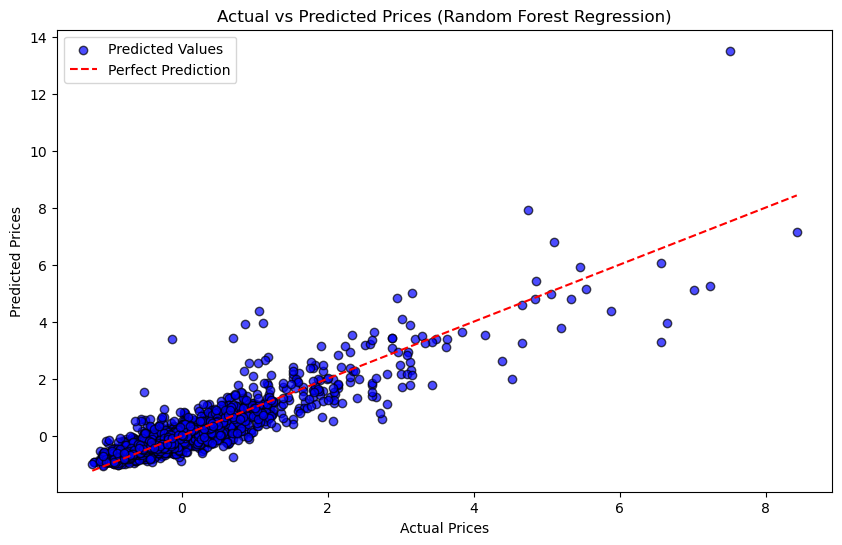

In [39]:
# Assuming 'y_test' and 'y_pred_test' from the last fold of your cross-validation

# Plotting the actual vs predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test, color='blue', edgecolors='k', alpha=0.7, label='Predicted Values')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Perfect Prediction')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual vs Predicted Prices (Random Forest Regression)')
plt.legend()
plt.show()


Figure 8 - Plotting Actual Price versus Predicted Price - Random Forest Regression

The plot is similar to the plot corresponding to SVR. The prediction is also able to follow the actual values as it also has a outlier, similar to the actual prices. The real comparison between Polynomial, SVR and Random Forest can be done based on the metric value involved.

#### 4.5 Comparison of Performance of Four Models

Following is the tabular format in which the model and its RMSE from the test dataset is gathered from the respective Model outputs:
| Model                      | Root Mean Squared Error         |   Mean Squared Error            |  R-squared                      |
|----------------------------|---------------------------------|---------------------------------|---------------------------------|
| Linear Regression          |    0.56805                      |    0.32534                      |    0.67633                      |
| Polynomial Regression      |    0.46889                      |    0.22149                      |    0.77874                      |
| Support Vector Regression  |    0.62994                      |    0.40173                      |    0.62748                      |
| Random Forest Regression   |    0.42064                      |    0.17718                      |    0.82110                      |

Please note, that the above RMSE values are the mean of the test dataset samples. From this table, the best model performed on this dataset is Random Forest Regression.

In the following section, I would like to apply Principal Component Analysis (PCA) and execute the Random Forest Regression to observe any improvement in the output.

#### 4.6 Executing Random Forest Regression with PCA

The main intention behind performing the PCA is, in the feature selection based on the correlation matrix, there can be chances where an interaction between the features got missed out. PCA enables to incorporate of such scenarios, if there are any, present in the dataset.

To perform the PCA, I will take the dataset from the step performed in Section 2.3, we are left with the dataset which has missing rows removed and variables are standardised. On this one, I will perform the one-hot encoding on Waterfront and condition. The dataset we have at this step is house_price_dataset_cleaned.

From this point, instead of checking on correlation matrix and manually performing feature selection based on the correlation coefficients. Principal Component Analysis will transform the dataset in which the number of features will be reduced and the features might be or might not be a linear combination of the actual fields/features.



In [30]:
# Detecting for missing values including NaN
missing_values = house_price_dataset_cleaned.isnull().sum()
print(missing_values)

# Getting the number of records (rows) and fields (columns)
num_records_cleaned, num_fields_cleaned = house_price_dataset_cleaned.shape
print(f"\nThe dataset has {num_records_cleaned} records and {num_fields_cleaned} fields.")


price                                0
bedrooms                             0
bathrooms                            0
sqft_living                          0
sqft_lot                             0
floors                               0
waterfront                           0
view                                 0
condition                            0
grade                                0
sqft_above                           0
sqft_basement                        0
yr_built                             0
yr_renovated                         0
zipcode                              0
sqft_living15                        0
sqft_lot15                           0
Year_Since_Last_Sale                 0
Distance_to_Seattle_Downtown_inKM    0
dtype: int64

The dataset has 21601 records and 19 fields.


Exhibit 29 - Checking on the dataset before Proceeding for PCA

In [31]:
# One-Hot Encode categorical fields
categorical_columns = ['waterfront', 'condition']
encoder = OneHotEncoder(sparse_output=False, drop='first')  # drop='first' to avoid multicollinearity

# Apply one-hot encoding to categorical columns and convert to DataFrame
encoded_categorical = encoder.fit_transform(house_price_dataset_cleaned[categorical_columns])
encoded_categorical_df = pd.DataFrame(encoded_categorical, columns=encoder.get_feature_names_out(categorical_columns))

# Concatenate encoded categorical features with the original DataFrame (excluding original categorical columns)
house_price_dataset_encoded_pca = pd.concat([house_price_dataset_cleaned.drop(columns=categorical_columns), encoded_categorical_df], axis=1)

house_price_dataset_encoded_pca

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,view,grade,sqft_above,sqft_basement,...,zipcode,sqft_living15,sqft_lot15,Year_Since_Last_Sale,Distance_to_Seattle_Downtown_inKM,waterfront_Y,condition_Fair,condition_Good,condition_Poor,condition_Very Good
0,-0.866577,-0.398647,-1.447445,-0.979751,-0.228237,-0.915555,-0.305601,-0.558869,-0.734716,-0.658615,...,98178.0,-0.943309,-0.260659,0.143208,-0.587879,0.0,0.0,0.0,0.0,0.0
1,-0.005715,-0.398647,0.175444,0.533458,-0.189792,0.936561,-0.305601,-0.558869,0.460666,0.245160,...,98125.0,-0.432689,-0.187804,-0.361007,-0.554117,0.0,0.0,0.0,0.0,0.0
2,-0.980686,-1.473836,-1.447445,-1.426094,-0.123190,-0.915555,-0.305601,-1.409679,-1.229773,-0.658615,...,98028.0,1.069992,-0.172310,-1.050984,-0.207463,0.0,0.0,0.0,0.0,0.0
3,0.174029,0.676541,1.149178,-0.130612,-0.243934,-0.915555,-0.305601,-0.558869,-0.891685,1.397474,...,98136.0,-0.914131,-0.284467,-0.361007,-0.740179,0.0,0.0,0.0,0.0,1.0
4,-0.081970,-0.398647,-0.149134,-0.435431,-0.169556,-0.915555,-0.305601,0.291940,-0.130988,-0.658615,...,98074.0,-0.272209,-0.192785,-0.989063,0.298268,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1637,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0
1675,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0
1702,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,1.0
5271,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0


Exhibit 30 - Encoding again and storing in a New dataframe

In [32]:
# Remove rows with any missing values
house_price_dataset_encoded_pca = house_price_dataset_encoded_pca.dropna()

# Detecting for missing values including NaN
missing_values_again = house_price_dataset_encoded_pca.isnull().sum()
print(missing_values_again)

price                                0
bedrooms                             0
bathrooms                            0
sqft_living                          0
sqft_lot                             0
floors                               0
view                                 0
grade                                0
sqft_above                           0
sqft_basement                        0
yr_built                             0
yr_renovated                         0
zipcode                              0
sqft_living15                        0
sqft_lot15                           0
Year_Since_Last_Sale                 0
Distance_to_Seattle_Downtown_inKM    0
waterfront_Y                         0
condition_Fair                       0
condition_Good                       0
condition_Poor                       0
condition_Very Good                  0
dtype: int64


Exhibit 31 - Checking for missing values and Removing them

Now it is ready for PCA.

In [42]:
# Invoking the PCA function.
from sklearn.decomposition import PCA

# Separate features and target variable
X = house_price_dataset_encoded_pca.drop('price', axis=1)
y = house_price_dataset_encoded_pca['price']

# Determine the number of features in the dataset
num_features = X.shape[1]

# Define the number of principal components (must be <= num_features)
n_components = min(10, num_features)  # Adjust based on available features

# Perform PCA on the standardized and encoded features
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X)


# Create k-fold splits using the PCA-transformed dataset
kf = KFold(n_splits=10, shuffle=True, random_state=42)
splits = list(kf.split(X_pca))

# Assuming best_params_rf contains the best parameters from previous tuning
best_rf_model = RandomForestRegressor(
    n_estimators=best_params_rf['n_estimators'],
    max_depth=best_params_rf['max_depth'],
    min_samples_split=best_params_rf['min_samples_split'],
    random_state=42
)

# Lists to store performance metrics for each fold
mse_scores_train = []
rmse_scores_train = []
r2_scores_train = []
mse_scores_test = []
rmse_scores_test = []
r2_scores_test = []

# Use the newly created k-fold splits to run the model
for fold, (train_index, test_index) in enumerate(splits):
    X_train, X_test = X_pca[train_index], X_pca[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]
    
    # Train the model
    best_rf_model.fit(X_train, y_train)
    
    # Predict on the training set
    y_pred_train = best_rf_model.predict(X_train)
    
    # Predict on the test set
    y_pred_test = best_rf_model.predict(X_test)
    
    # Evaluate performance on the training set
    mse_train = mean_squared_error(y_train, y_pred_train)
    rmse_train = np.sqrt(mse_train)
    r2_train = r2_score(y_train, y_pred_train)
    
    # Evaluate performance on the test set
    mse_test = mean_squared_error(y_test, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(y_test, y_pred_test)
    
    # Store the metrics for the training set
    mse_scores_train.append(mse_train)
    rmse_scores_train.append(rmse_train)
    r2_scores_train.append(r2_train)
    
    # Store the metrics for the test set
    mse_scores_test.append(mse_test)
    rmse_scores_test.append(rmse_test)
    r2_scores_test.append(r2_test)
    
    print(f'Fold {fold + 1} - Training')
    print(f'MSE: {mse_train}, RMSE: {rmse_train}, R²: {r2_train}')
    print(f'Fold {fold + 1} - Test')
    print(f'MSE: {mse_test}, RMSE: {rmse_test}, R²: {r2_test}')
    print('-' * 40)

# Calculate mean and standard deviation of the performance metrics for the training set
mean_mse_train = np.mean(mse_scores_train)
std_mse_train = np.std(mse_scores_train)
mean_rmse_train = np.mean(rmse_scores_train)
std_rmse_train = np.std(rmse_scores_train)
mean_r2_train = np.mean(r2_scores_train)
std_r2_train = np.std(r2_scores_train)

# Calculate mean and standard deviation of the performance metrics for the test set
mean_mse_test = np.mean(mse_scores_test)
std_mse_test = np.std(mse_scores_test)
mean_rmse_test = np.mean(rmse_scores_test)
std_rmse_test = np.std(rmse_scores_test)
mean_r2_test = np.mean(r2_scores_test)
std_r2_test = np.std(r2_scores_test)

print(f'Random Forest with PCA - Training Set - Mean MSE: {mean_mse_train}, Std MSE: {std_mse_train}')
print(f'Random Forest with PCA - Training Set - Mean RMSE: {mean_rmse_train}, Std RMSE: {std_rmse_train}')
print(f'Random Forest with PCA - Training Set - Mean R²: {mean_r2_train}, Std R²: {std_r2_train}')

print(f'Random Forest with PCA - Test Set - Mean MSE: {mean_mse_test}, Std MSE: {std_mse_test}')
print(f'Random Forest with PCA - Test Set - Mean RMSE: {mean_rmse_test}, Std RMSE: {std_rmse_test}')
print(f'Random Forest with PCA - Test Set - Mean R²: {mean_r2_test}, Std R²: {std_r2_test}')



Fold 1 - Training
MSE: 0.037921948570221874, RMSE: 0.19473558629644935, R²: 0.9619104776415245
Fold 1 - Test
MSE: 0.19305526956714258, RMSE: 0.43938055210391663, R²: 0.8149673630895472
----------------------------------------
Fold 2 - Training
MSE: 0.0361446231159867, RMSE: 0.190117392986509, R²: 0.9634565178893322
Fold 2 - Test
MSE: 0.24586286097797594, RMSE: 0.49584560195485844, R²: 0.7769022308680301
----------------------------------------
Fold 3 - Training
MSE: 0.035769351398455794, RMSE: 0.18912787049627508, R²: 0.9641896650541394
Fold 3 - Test
MSE: 0.20693540445747158, RMSE: 0.4549015327051246, R²: 0.7959172446775187
----------------------------------------
Fold 4 - Training
MSE: 0.03522474418690812, RMSE: 0.18768256228778454, R²: 0.9642166704763586
Fold 4 - Test
MSE: 0.23760633994975047, RMSE: 0.4874488075170053, R²: 0.7923702445491292
----------------------------------------
Fold 5 - Training
MSE: 0.037271301509467024, RMSE: 0.19305776728603027, R²: 0.9628891598876034
Fold 5 -

Exhibit 32 - Applying PCA followed by Random Forest Regression

From Exhibit 32, the RMSE corresponding to Random Forest Regression with PCA is 0.44890, this RMSE is the mean value of RMSE of test dataset of model. Comparing this against the RMSE value of 0.42064 mentioned in Section 4.5. As visible, the PCA hasn't improved the model output. Given a choice, I would pursue the feature selection, described in Section 2.6.

### 5. Saving the Model

Since we have found out the Random Forest Regression model is the best among these four, I am going to save this model.

In [45]:
import joblib

# Instantiate the Random Forest model with the best parameters
best_rf_model = RandomForestRegressor(
    n_estimators=best_params_rf['n_estimators'],
    max_depth=best_params_rf['max_depth'],
    min_samples_split=best_params_rf['min_samples_split'],
    random_state=42
)

# Lists to store performance metrics for each fold
mse_scores_train = []
rmse_scores_train = []
r2_scores_train = []
mse_scores_test = []
rmse_scores_test = []
r2_scores_test = []

# Use the stored k-fold splits to run the model
for fold, (train_index, test_index) in enumerate(splits):
    X_train, X_test = X_cleaned.iloc[train_index], X_cleaned.iloc[test_index]
    y_train, y_test = y_cleaned.iloc[train_index], y_cleaned.iloc[test_index]
    
    # Train the model
    best_rf_model.fit(X_train, y_train)
    
    # Predict on the training set
    y_pred_train = best_rf_model.predict(X_train)
    
    # Predict on the test set
    y_pred_test = best_rf_model.predict(X_test)
    
    # Evaluate performance on the training set
    mse_train = mean_squared_error(y_train, y_pred_train)
    rmse_train = np.sqrt(mse_train)
    r2_train = r2_score(y_train, y_pred_train)
    
    # Evaluate performance on the test set
    mse_test = mean_squared_error(y_test, y_pred_test)
    rmse_test = np.sqrt(mse_test)
    r2_test = r2_score(y_test, y_pred_test)
    
    # Store the metrics for the training set
    mse_scores_train.append(mse_train)
    rmse_scores_train.append(rmse_train)
    r2_scores_train.append(r2_train)
    
    # Store the metrics for the test set
    mse_scores_test.append(mse_test)
    rmse_scores_test.append(rmse_test)
    r2_scores_test.append(r2_test)
    
    print(f'Fold {fold + 1} - Training')
    print(f'MSE: {mse_train}, RMSE: {rmse_train}, R²: {r2_train}')
    print(f'Fold {fold + 1} - Test')
    print(f'MSE: {mse_test}, RMSE: {rmse_test}, R²: {r2_test}')
    print('-' * 40)

# Calculate mean and standard deviation of the performance metrics for the training set
mean_mse_train = np.mean(mse_scores_train)
std_mse_train = np.std(mse_scores_train)
mean_rmse_train = np.mean(rmse_scores_train)
std_rmse_train = np.std(rmse_scores_train)
mean_r2_train = np.mean(r2_scores_train)
std_r2_train = np.std(r2_scores_train)

# Calculate mean and standard deviation of the performance metrics for the test set
mean_mse_test = np.mean(mse_scores_test)
std_mse_test = np.std(mse_scores_test)
mean_rmse_test = np.mean(rmse_scores_test)
std_rmse_test = np.std(rmse_scores_test)
mean_r2_test = np.mean(r2_scores_test)
std_r2_test = np.std(r2_scores_test)

print(f'Random Forest with Best Parameters - Training Set - Mean MSE: {mean_mse_train}, Std MSE: {std_mse_train}')
print(f'Random Forest with Best Parameters - Training Set - Mean RMSE: {mean_rmse_train}, Std RMSE: {std_rmse_train}')
print(f'Random Forest with Best Parameters - Training Set - Mean R²: {mean_r2_train}, Std R²: {std_r2_train}')

print(f'Random Forest with Best Parameters - Test Set - Mean MSE: {mean_mse_test}, Std MSE: {std_mse_test}')
print(f'Random Forest with Best Parameters - Test Set - Mean RMSE: {mean_rmse_test}, Std RMSE: {std_rmse_test}')
print(f'Random Forest with Best Parameters - Test Set - Mean R²: {mean_r2_test}, Std R²: {std_r2_test}')

# Save the trained model to a file
joblib_file = "best_random_forest_model.joblib"
joblib.dump(best_rf_model, joblib_file)


Fold 1 - Training
MSE: 0.037254235300741845, RMSE: 0.19301356247875912, R²: 0.9625811414777937
Fold 1 - Test
MSE: 0.16993156887024652, RMSE: 0.4122275692748443, R²: 0.837130131941535
----------------------------------------
Fold 2 - Training
MSE: 0.03736602734434044, RMSE: 0.19330294189261693, R²: 0.9622216353612862
Fold 2 - Test
MSE: 0.19456434895843278, RMSE: 0.4410944898300508, R²: 0.8234508781335267
----------------------------------------
Fold 3 - Training
MSE: 0.0370367827845616, RMSE: 0.19244942916143348, R²: 0.9629207814797142
Fold 3 - Test
MSE: 0.17065282749299365, RMSE: 0.4131014736030285, R²: 0.8316996585014055
----------------------------------------
Fold 4 - Training
MSE: 0.03653966752959926, RMSE: 0.19115351822448692, R²: 0.9628808954024454
Fold 4 - Test
MSE: 0.1950291017448923, RMSE: 0.4416209933244708, R²: 0.829575908161126
----------------------------------------
Fold 5 - Training
MSE: 0.03664799880411434, RMSE: 0.19143667047907603, R²: 0.9635097791335959
Fold 5 - Test

['best_random_forest_model.joblib']

Exhibit 33 - The model saved to best_random_forest_model.joblib

In [46]:
# Assuming X_test contains the test features and y_test contains the actual test labels

# Load the saved model from the file
joblib_file = "best_random_forest_model.joblib"
loaded_rf_model = joblib.load(joblib_file)

# Make predictions on the test dataset
y_pred_test = loaded_rf_model.predict(X_test)

# Evaluate the model performance
mse_test = mean_squared_error(y_test, y_pred_test)
rmse_test = np.sqrt(mse_test)
r2_test = r2_score(y_test, y_pred_test)

print(f'Test Set - MSE: {mse_test}')
print(f'Test Set - RMSE: {rmse_test}')
print(f'Test Set - R²: {r2_test}')



Test Set - MSE: 0.17582153067441694
Test Set - RMSE: 0.4193107805368435
Test Set - R²: 0.8149278917408744


Exhibit 34 - Saved Model Invoked and output

The RMSE for the test dataset generated from the saved Random Regression Model is 0.419310, which is near to 0.42064 generated from the Random Forest Regression with which the training and testing was done, described in Section 4.4

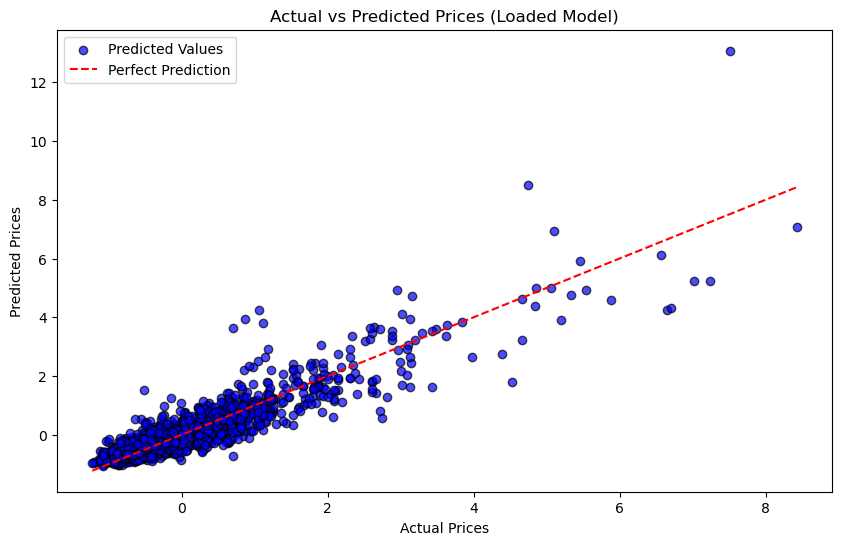

In [47]:
# Plot the actual vs predicted prices for the test set
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_test, color='blue', edgecolors='k', alpha=0.7, label='Predicted Values')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--', label='Perfect Prediction')
plt.xlabel('Actual Prices')
plt.ylabel('Predicted Prices')
plt.title('Actual vs Predicted Prices (Loaded Model)')
plt.legend()
plt.show()


Figure 9 - Actual versus Predicted Price Plot - Saved Random Forest Regression Model

The performance is similar to the one which is shown in Figure 8. 